In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

In [2]:
import os
import numpy as np
import astropy.units as u
from astropy.coordinates import SkyCoord, Angle
from regions import CircleSkyRegion
from gammapy.spectrum import (
    SpectrumDatasetOnOff,
    SpectrumDataset,
    SpectrumDatasetMaker,
)
from gammapy.modeling import Fit, Parameter
from gammapy.modeling.models import (
    PowerLawSpectralModel,
    SpectralModel,
    SkyModel,
    ExpCutoffPowerLawSpectralModel,
)
from gammapy.irf import load_cta_irfs
from gammapy.data import Observation
from gammapy.maps import MapAxis

In [3]:
livetime = 48 * u.h
pointing = SkyCoord(0, 0, unit="deg", frame="galactic")
offset = 0.5 * u.deg
# Reconstructed and true energy axis
energy_axis = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 10), unit="TeV", name="energy", interp="log"
)
energy_axis_true = MapAxis.from_edges(
    np.logspace(-1.5, 2.0, 31), unit="TeV", name="energy", interp="log"
)

on_region_radius = Angle("0.11 deg")
on_region = CircleSkyRegion(center=pointing, radius=on_region_radius)

In [4]:
# Define spectral model - a simple Power Law in this case
model_simu = ExpCutoffPowerLawSpectralModel(
    index=2.22,
    amplitude=1.289e-12 * u.Unit("cm-2 s-1 TeV-1"),
    reference=1 * u.TeV,
    lambda_=0.5 * u.Unit("TeV-1"),
    alpha = 1,
)
print(model_simu)
# we set the sky model used in the dataset
model = SkyModel(spectral_model=model_simu)

ExpCutoffPowerLawSpectralModel

   name     value   error      unit      min max frozen
--------- --------- ----- -------------- --- --- ------
    index 2.220e+00   nan                nan nan  False
amplitude 1.289e-12   nan cm-2 s-1 TeV-1 nan nan  False
reference 1.000e+00   nan            TeV nan nan   True
  lambda_ 5.000e-01   nan          TeV-1 nan nan  False
    alpha 1.000e+00   nan                nan nan   True


In [5]:
os.environ['CALDB'] = '/home/rishank/anaconda2/envs/cta/share/caldb/'
!echo $CALDB
!ls $CALDB

/home/rishank/anaconda2/envs/cta/share/caldb/
data


In [6]:
# Load the IRFs
# In this simulation, we use the CTA-1DC irfs shipped with gammapy.
irfs = load_cta_irfs(
    "$CALDB/data/cta/prod3b-v2/bcf/South_z20_50h/irf_file.fits"
)

In [7]:
obs = Observation.create(pointing=pointing, livetime=livetime, irfs=irfs)
print(obs)

Info for OBS_ID = 1
- Pointing pos: RA 266.40 deg / Dec -28.94 deg
- Livetime duration: 172800.0 s



In [8]:
# Make the SpectrumDataset
dataset_empty = SpectrumDataset.create(
    e_reco=energy_axis.edges, e_true=energy_axis_true.edges, region=on_region
)
maker = SpectrumDatasetMaker(selection=["aeff", "edisp", "background"])
dataset = maker.run(dataset_empty, obs)

In [9]:
# Set the model on the dataset, and fake
dataset.model = model
dataset.fake(random_state=42)
print(dataset)

SpectrumDataset

    Name                            : 1 

    Total counts                    : 20280 
    Total predicted counts          : nan
    Total background counts         : 20309.41

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 1.73e+05 s

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : cash
    Fit statistic value (-2 log(L)) : nan

    Number of parameters            : 0
    Number of free parameters       : 0




In [10]:
dataset_onoff = SpectrumDatasetOnOff(
    aeff=dataset.aeff,
    edisp=dataset.edisp,
    models=model,
    livetime=livetime,
    acceptance=1,
    acceptance_off=5,
)
dataset_onoff.fake(background_model=dataset.background)
print(dataset_onoff)

SpectrumDatasetOnOff

    Name                            :  

    Total counts                    : 33380 
    Total predicted counts          : 33182.06
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0



In [11]:

%%time

n_obs = 10000
datasets = []

for idx in range(n_obs):
    dataset_onoff.fake(random_state=idx, background_model=dataset.background)
    dataset_onoff.name = f"obs_{idx}"
    datasets.append(dataset_onoff.copy())

CPU times: user 1min 1s, sys: 446 ms, total: 1min 2s
Wall time: 1min 4s


In [12]:
print(*datasets, sep = "\n") 

SpectrumDatasetOnOff

    Name                            : obs_0 

    Total counts                    : 33357 
    Total predicted counts          : 33342.46
    Total off counts                : 102065.00

    Total background counts         : 20413.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1 

    Total counts                    : 32889 
    Total predicted counts          : 33263.86
    Total off counts                : 101672.00

    Total background counts         : 20

SpectrumDatasetOnOff

    Name                            : obs_14 

    Total counts                    : 33626 
    Total predicted counts          : 33342.06
    Total off counts                : 102063.00

    Total background counts         : 20412.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_15 

    Total counts                    : 33136 
    Total predicted counts          : 33228.86
    Total off counts                : 101497.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_32 

    Total counts                    : 33494 
    Total predicted counts          : 33257.86
    Total off counts                : 101642.00

    Total background counts         : 20328.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_33 

    Total counts                    : 33515 
    Total predicted counts          : 33278.46
    Total off counts                : 101745.00

    Total background counts         :

SpectrumDatasetOnOff

    Name                            : obs_51 

    Total counts                    : 33026 
    Total predicted counts          : 33325.26
    Total off counts                : 101979.00

    Total background counts         : 20395.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_52 

    Total counts                    : 33249 
    Total predicted counts          : 33290.06
    Total off counts                : 101803.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_69 

    Total counts                    : 33008 
    Total predicted counts          : 33227.66
    Total off counts                : 101491.00

    Total background counts         : 20298.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_70 

    Total counts                    : 33196 
    Total predicted counts          : 33125.26
    Total off counts                : 100979.00

    Total background counts         : 

SpectrumDatasetOnOff

    Name                            : obs_86 

    Total counts                    : 33266 
    Total predicted counts          : 33205.66
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_87 

    Total counts                    : 33248 
    Total predicted counts          : 33293.26
    Total off counts                : 101819.00

    Total background counts         : 


SpectrumDatasetOnOff

    Name                            : obs_103 

    Total counts                    : 33227 
    Total predicted counts          : 33230.86
    Total off counts                : 101507.00

    Total background counts         : 20301.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_104 

    Total counts                    : 33330 
    Total predicted counts          : 33099.06
    Total off counts                : 100848.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_119 

    Total counts                    : 33244 
    Total predicted counts          : 33059.66
    Total off counts                : 100651.00

    Total background counts         : 20130.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_120 

    Total counts                    : 33268 
    Total predicted counts          : 33256.26
    Total off counts                : 101634.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_137 

    Total counts                    : 33494 
    Total predicted counts          : 33285.86
    Total off counts                : 101782.00

    Total background counts         : 20356.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_138 

    Total counts                    : 33642 
    Total predicted counts          : 33257.26
    Total off counts                : 101639.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_156 

    Total counts                    : 32989 
    Total predicted counts          : 33274.46
    Total off counts                : 101725.00

    Total background counts         : 20345.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_157 

    Total counts                    : 33135 
    Total predicted counts          : 33231.06
    Total off counts                : 101508.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_174 

    Total counts                    : 33135 
    Total predicted counts          : 33203.06
    Total off counts                : 101368.00

    Total background counts         : 20273.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_175 

    Total counts                    : 33384 
    Total predicted counts          : 33284.06
    Total off counts                : 101773.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_192 

    Total counts                    : 33103 
    Total predicted counts          : 33242.66
    Total off counts                : 101566.00

    Total background counts         : 20313.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_193 

    Total counts                    : 33193 
    Total predicted counts          : 33155.06
    Total off counts                : 101128.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_211 

    Total counts                    : 33832 
    Total predicted counts          : 33179.26
    Total off counts                : 101249.00

    Total background counts         : 20249.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_212 

    Total counts                    : 33029 
    Total predicted counts          : 33322.86
    Total off counts                : 101967.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_230 

    Total counts                    : 33464 
    Total predicted counts          : 33320.86
    Total off counts                : 101957.00

    Total background counts         : 20391.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_231 

    Total counts                    : 33447 
    Total predicted counts          : 33161.46
    Total off counts                : 101160.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_249 

    Total counts                    : 33288 
    Total predicted counts          : 33263.06
    Total off counts                : 101668.00

    Total background counts         : 20333.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_250 

    Total counts                    : 33310 
    Total predicted counts          : 33255.26
    Total off counts                : 101629.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_263 

    Total counts                    : 33499 
    Total predicted counts          : 33188.66
    Total off counts                : 101296.00

    Total background counts         : 20259.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_264 

    Total counts                    : 33489 
    Total predicted counts          : 33195.66
    Total off counts                : 101331.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_280 

    Total counts                    : 33260 
    Total predicted counts          : 33296.66
    Total off counts                : 101836.00

    Total background counts         : 20367.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_281 

    Total counts                    : 32967 
    Total predicted counts          : 33185.06
    Total off counts                : 101278.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_294 

    Total counts                    : 33173 
    Total predicted counts          : 33224.06
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_295 

    Total counts                    : 33541 
    Total predicted counts          : 33297.06
    Total off counts                : 101838.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_310 

    Total counts                    : 33254 
    Total predicted counts          : 33334.46
    Total off counts                : 102025.00

    Total background counts         : 20405.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_311 

    Total counts                    : 33282 
    Total predicted counts          : 33306.26
    Total off counts                : 101884.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_326 

    Total counts                    : 33423 
    Total predicted counts          : 33220.26
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_327 

    Total counts                    : 33163 
    Total predicted counts          : 33234.86
    Total off counts                : 101527.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_344 

    Total counts                    : 33273 
    Total predicted counts          : 33307.46
    Total off counts                : 101890.00

    Total background counts         : 20378.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_345 

    Total counts                    : 33102 
    Total predicted counts          : 33273.86
    Total off counts                : 101722.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_363 

    Total counts                    : 33091 
    Total predicted counts          : 33381.86
    Total off counts                : 102262.00

    Total background counts         : 20452.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_364 

    Total counts                    : 32863 
    Total predicted counts          : 33233.26
    Total off counts                : 101519.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_382 

    Total counts                    : 33344 
    Total predicted counts          : 33200.06
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_383 

    Total counts                    : 33188 
    Total predicted counts          : 33373.26
    Total off counts                : 102219.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_402 

    Total counts                    : 33084 
    Total predicted counts          : 33232.26
    Total off counts                : 101514.00

    Total background counts         : 20302.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_403 

    Total counts                    : 33359 
    Total predicted counts          : 33306.06
    Total off counts                : 101883.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_421 

    Total counts                    : 33332 
    Total predicted counts          : 33200.06
    Total off counts                : 101353.00

    Total background counts         : 20270.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_422 

    Total counts                    : 33046 
    Total predicted counts          : 33336.46
    Total off counts                : 102035.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_439 

    Total counts                    : 33315 
    Total predicted counts          : 33304.66
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_440 

    Total counts                    : 32970 
    Total predicted counts          : 33195.46
    Total off counts                : 101330.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_457 

    Total counts                    : 33084 
    Total predicted counts          : 33201.06
    Total off counts                : 101358.00

    Total background counts         : 20271.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_458 

    Total counts                    : 33599 
    Total predicted counts          : 33200.46
    Total off counts                : 101355.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_476 

    Total counts                    : 33210 
    Total predicted counts          : 33156.06
    Total off counts                : 101133.00

    Total background counts         : 20226.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_477 

    Total counts                    : 33327 
    Total predicted counts          : 33227.46
    Total off counts                : 101490.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_495 

    Total counts                    : 33443 
    Total predicted counts          : 33186.06
    Total off counts                : 101283.00

    Total background counts         : 20256.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_496 

    Total counts                    : 33261 
    Total predicted counts          : 33232.06
    Total off counts                : 101513.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_514 

    Total counts                    : 32919 
    Total predicted counts          : 33214.86
    Total off counts                : 101427.00

    Total background counts         : 20285.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_515 

    Total counts                    : 33405 
    Total predicted counts          : 33288.86
    Total off counts                : 101797.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_528 

    Total counts                    : 33400 
    Total predicted counts          : 33136.26
    Total off counts                : 101034.00

    Total background counts         : 20206.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_529 

    Total counts                    : 33146 
    Total predicted counts          : 33192.66
    Total off counts                : 101316.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_545 

    Total counts                    : 33156 
    Total predicted counts          : 33224.06
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_546 

    Total counts                    : 33290 
    Total predicted counts          : 33159.66
    Total off counts                : 101151.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_563 

    Total counts                    : 33457 
    Total predicted counts          : 33287.46
    Total off counts                : 101790.00

    Total background counts         : 20358.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_564 

    Total counts                    : 33072 
    Total predicted counts          : 33121.06
    Total off counts                : 100958.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_581 

    Total counts                    : 32970 
    Total predicted counts          : 33219.46
    Total off counts                : 101450.00

    Total background counts         : 20290.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_582 

    Total counts                    : 33535 
    Total predicted counts          : 33213.46
    Total off counts                : 101420.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_600 

    Total counts                    : 33457 
    Total predicted counts          : 33291.06
    Total off counts                : 101808.00

    Total background counts         : 20361.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_601 

    Total counts                    : 33368 
    Total predicted counts          : 33260.26
    Total off counts                : 101654.00

    Total background counts        


SpectrumDatasetOnOff

    Name                            : obs_620 

    Total counts                    : 33411 
    Total predicted counts          : 33291.46
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_621 

    Total counts                    : 33143 
    Total predicted counts          : 33279.06
    Total off counts                : 101748.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_637 

    Total counts                    : 33160 
    Total predicted counts          : 33320.46
    Total off counts                : 101955.00

    Total background counts         : 20391.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_638 

    Total counts                    : 33273 
    Total predicted counts          : 33215.86
    Total off counts                : 101432.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_657 

    Total counts                    : 33011 
    Total predicted counts          : 33271.26
    Total off counts                : 101709.00

    Total background counts         : 20341.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_658 

    Total counts                    : 33372 
    Total predicted counts          : 33216.66
    Total off counts                : 101436.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_676 

    Total counts                    : 33274 
    Total predicted counts          : 33262.26
    Total off counts                : 101664.00

    Total background counts         : 20332.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_677 

    Total counts                    : 33278 
    Total predicted counts          : 33324.66
    Total off counts                : 101976.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_695 

    Total counts                    : 33583 
    Total predicted counts          : 33151.26
    Total off counts                : 101109.00

    Total background counts         : 20221.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_696 

    Total counts                    : 33514 
    Total predicted counts          : 33236.06
    Total off counts                : 101533.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_714 

    Total counts                    : 32786 
    Total predicted counts          : 33333.66
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_715 

    Total counts                    : 33191 
    Total predicted counts          : 33293.86
    Total off counts                : 101822.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_732 

    Total counts                    : 33363 
    Total predicted counts          : 33245.26
    Total off counts                : 101579.00

    Total background counts         : 20315.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_733 

    Total counts                    : 33064 
    Total predicted counts          : 33125.66
    Total off counts                : 100981.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_750 

    Total counts                    : 33578 
    Total predicted counts          : 33210.86
    Total off counts                : 101407.00

    Total background counts         : 20281.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_751 

    Total counts                    : 33320 
    Total predicted counts          : 33297.46
    Total off counts                : 101840.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_769 

    Total counts                    : 33054 
    Total predicted counts          : 33327.86
    Total off counts                : 101992.00

    Total background counts         : 20398.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_770 

    Total counts                    : 33351 
    Total predicted counts          : 33233.66
    Total off counts                : 101521.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_789 

    Total counts                    : 33256 
    Total predicted counts          : 33336.46
    Total off counts                : 102035.00

    Total background counts         : 20407.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_790 

    Total counts                    : 33389 
    Total predicted counts          : 33164.66
    Total off counts                : 101176.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_805 

    Total counts                    : 33031 
    Total predicted counts          : 33407.86
    Total off counts                : 102392.00

    Total background counts         : 20478.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_806 

    Total counts                    : 33377 
    Total predicted counts          : 33178.26
    Total off counts                : 101244.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_823 

    Total counts                    : 33508 
    Total predicted counts          : 33216.26
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 17.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_824 

    Total counts                    : 33275 
    Total predicted counts          : 33163.06
    Total off counts                : 101168.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_838 

    Total counts                    : 33235 
    Total predicted counts          : 33334.66
    Total off counts                : 102026.00

    Total background counts         : 20405.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_839 

    Total counts                    : 32801 
    Total predicted counts          : 33320.06
    Total off counts                : 101953.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_858 

    Total counts                    : 33167 
    Total predicted counts          : 33303.66
    Total off counts                : 101871.00

    Total background counts         : 20374.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_859 

    Total counts                    : 32965 
    Total predicted counts          : 33262.46
    Total off counts                : 101665.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_877 

    Total counts                    : 33112 
    Total predicted counts          : 33278.66
    Total off counts                : 101746.00

    Total background counts         : 20349.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_878 

    Total counts                    : 33206 
    Total predicted counts          : 33214.46
    Total off counts                : 101425.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_894 

    Total counts                    : 33249 
    Total predicted counts          : 33127.46
    Total off counts                : 100990.00

    Total background counts         : 20198.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_895 

    Total counts                    : 33504 
    Total predicted counts          : 33224.06
    Total off counts                : 101473.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_913 

    Total counts                    : 33212 
    Total predicted counts          : 33215.86
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_914 

    Total counts                    : 33237 
    Total predicted counts          : 33252.46
    Total off counts                : 101615.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_932 

    Total counts                    : 33305 
    Total predicted counts          : 33283.26
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_933 

    Total counts                    : 33183 
    Total predicted counts          : 33254.06
    Total off counts                : 101623.00

    Total background counts         


SpectrumDatasetOnOff

    Name                            : obs_951 

    Total counts                    : 33264 
    Total predicted counts          : 33153.26
    Total off counts                : 101119.00

    Total background counts         : 20223.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_952 

    Total counts                    : 33183 
    Total predicted counts          : 33236.26
    Total off counts                : 101534.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_966 

    Total counts                    : 33361 
    Total predicted counts          : 33255.26
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_967 

    Total counts                    : 33224 
    Total predicted counts          : 33239.26
    Total off counts                : 101549.00

    Total background counts         

SpectrumDatasetOnOff

    Name                            : obs_984 

    Total counts                    : 32864 
    Total predicted counts          : 33220.66
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_985 

    Total counts                    : 32965 
    Total predicted counts          : 33265.26
    Total off counts                : 101679.00

    Total background counts        

SpectrumDatasetOnOff

    Name                            : obs_1003 

    Total counts                    : 33310 
    Total predicted counts          : 33205.06
    Total off counts                : 101378.00

    Total background counts         : 20275.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1004 

    Total counts                    : 33220 
    Total predicted counts          : 33260.06
    Total off counts                : 101653.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1020 

    Total counts                    : 33130 
    Total predicted counts          : 33233.46
    Total off counts                : 101520.00

    Total background counts         : 20304.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1021 

    Total counts                    : 33253 
    Total predicted counts          : 33183.06
    Total off counts                : 101268.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1038 

    Total counts                    : 33431 
    Total predicted counts          : 33330.66
    Total off counts                : 102006.00

    Total background counts         : 20401.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1039 

    Total counts                    : 33287 
    Total predicted counts          : 33213.26
    Total off counts                : 101419.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1056 

    Total counts                    : 33220 
    Total predicted counts          : 33165.86
    Total off counts                : 101182.00

    Total background counts         : 20236.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1057 

    Total counts                    : 33141 
    Total predicted counts          : 33226.26
    Total off counts                : 101484.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1073 

    Total counts                    : 33167 
    Total predicted counts          : 33163.46
    Total off counts                : 101170.00

    Total background counts         : 20234.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1074 

    Total counts                    : 33260 
    Total predicted counts          : 33255.86
    Total off counts                : 101632.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1093 

    Total counts                    : 33166 
    Total predicted counts          : 33263.46
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1094 

    Total counts                    : 33316 
    Total predicted counts          : 33138.66
    Total off counts                : 101046.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1113 

    Total counts                    : 33239 
    Total predicted counts          : 33204.86
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1114 

    Total counts                    : 33402 
    Total predicted counts          : 33171.26
    Total off counts                : 101209.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1133 

    Total counts                    : 32950 
    Total predicted counts          : 33303.86
    Total off counts                : 101872.00

    Total background counts         : 20374.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1134 

    Total counts                    : 33216 
    Total predicted counts          : 33266.86
    Total off counts                : 101687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1152 

    Total counts                    : 33108 
    Total predicted counts          : 33214.66
    Total off counts                : 101426.00

    Total background counts         : 20285.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1153 

    Total counts                    : 33251 
    Total predicted counts          : 33281.66
    Total off counts                : 101761.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1171 

    Total counts                    : 33464 
    Total predicted counts          : 33164.86
    Total off counts                : 101177.00

    Total background counts         : 20235.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1172 

    Total counts                    : 33378 
    Total predicted counts          : 33200.06
    Total off counts                : 101353.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1190 

    Total counts                    : 33416 
    Total predicted counts          : 33315.26
    Total off counts                : 101929.00

    Total background counts         : 20385.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.90

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1191 

    Total counts                    : 33442 
    Total predicted counts          : 33214.66
    Total off counts                : 101426.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1209 

    Total counts                    : 33077 
    Total predicted counts          : 33248.46
    Total off counts                : 101595.00

    Total background counts         : 20319.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1210 

    Total counts                    : 33140 
    Total predicted counts          : 33208.46
    Total off counts                : 101395.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1228 

    Total counts                    : 33399 
    Total predicted counts          : 33372.66
    Total off counts                : 102216.00

    Total background counts         : 20443.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1229 

    Total counts                    : 33026 
    Total predicted counts          : 33241.46
    Total off counts                : 101560.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1246 

    Total counts                    : 33540 
    Total predicted counts          : 33340.46
    Total off counts                : 102055.00

    Total background counts         : 20411.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1247 

    Total counts                    : 33224 
    Total predicted counts          : 33285.86
    Total off counts                : 101782.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1264 

    Total counts                    : 33250 
    Total predicted counts          : 33294.06
    Total off counts                : 101823.00

    Total background counts         : 20364.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1265 

    Total counts                    : 33262 
    Total predicted counts          : 33308.46
    Total off counts                : 101895.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1282 

    Total counts                    : 33165 
    Total predicted counts          : 33134.46
    Total off counts                : 101025.00

    Total background counts         : 20205.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1283 

    Total counts                    : 32924 
    Total predicted counts          : 33059.46
    Total off counts                : 100650.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1301 

    Total counts                    : 33338 
    Total predicted counts          : 33290.86
    Total off counts                : 101807.00

    Total background counts         : 20361.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1302 

    Total counts                    : 33271 
    Total predicted counts          : 33121.46
    Total off counts                : 100960.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1320 

    Total counts                    : 33556 
    Total predicted counts          : 33073.06
    Total off counts                : 100718.00

    Total background counts         : 20143.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1321 

    Total counts                    : 33357 
    Total predicted counts          : 33253.06
    Total off counts                : 101618.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1340 

    Total counts                    : 33182 
    Total predicted counts          : 33283.26
    Total off counts                : 101769.00

    Total background counts         : 20353.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1341 

    Total counts                    : 33331 
    Total predicted counts          : 33198.46
    Total off counts                : 101345.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1358 

    Total counts                    : 33279 
    Total predicted counts          : 33216.86
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1359 

    Total counts                    : 33148 
    Total predicted counts          : 33218.86
    Total off counts                : 101447.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1377 

    Total counts                    : 33400 
    Total predicted counts          : 33364.06
    Total off counts                : 102173.00

    Total background counts         : 20434.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1378 

    Total counts                    : 32941 
    Total predicted counts          : 33295.66
    Total off counts                : 101831.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1395 

    Total counts                    : 33174 
    Total predicted counts          : 33216.26
    Total off counts                : 101434.00

    Total background counts         : 20286.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1396 

    Total counts                    : 33350 
    Total predicted counts          : 33237.06
    Total off counts                : 101538.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1413 

    Total counts                    : 32707 
    Total predicted counts          : 33250.06
    Total off counts                : 101603.00

    Total background counts         : 20320.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 23.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1414 

    Total counts                    : 33235 
    Total predicted counts          : 33293.06
    Total off counts                : 101818.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1431 

    Total counts                    : 33170 
    Total predicted counts          : 33263.46
    Total off counts                : 101670.00

    Total background counts         : 20334.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1432 

    Total counts                    : 33252 
    Total predicted counts          : 33227.86
    Total off counts                : 101492.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1449 

    Total counts                    : 33326 
    Total predicted counts          : 33233.66
    Total off counts                : 101521.00

    Total background counts         : 20304.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1450 

    Total counts                    : 33349 
    Total predicted counts          : 33236.46
    Total off counts                : 101535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1468 

    Total counts                    : 33411 
    Total predicted counts          : 33229.06
    Total off counts                : 101498.00

    Total background counts         : 20299.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1469 

    Total counts                    : 33356 
    Total predicted counts          : 33249.26
    Total off counts                : 101599.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1487 

    Total counts                    : 33342 
    Total predicted counts          : 33220.26
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1488 

    Total counts                    : 33384 
    Total predicted counts          : 33253.86
    Total off counts                : 101622.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1505 

    Total counts                    : 33166 
    Total predicted counts          : 33251.46
    Total off counts                : 101610.00

    Total background counts         : 20322.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1506 

    Total counts                    : 33241 
    Total predicted counts          : 33256.26
    Total off counts                : 101634.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1525 

    Total counts                    : 33360 
    Total predicted counts          : 33254.66
    Total off counts                : 101626.00

    Total background counts         : 20325.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1526 

    Total counts                    : 33335 
    Total predicted counts          : 33291.86
    Total off counts                : 101812.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1543 

    Total counts                    : 33449 
    Total predicted counts          : 33270.46
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1544 

    Total counts                    : 33347 
    Total predicted counts          : 33216.06
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1561 

    Total counts                    : 33230 
    Total predicted counts          : 33255.26
    Total off counts                : 101629.00

    Total background counts         : 20325.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1562 

    Total counts                    : 33498 
    Total predicted counts          : 33149.46
    Total off counts                : 101100.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1581 

    Total counts                    : 33421 
    Total predicted counts          : 33244.66
    Total off counts                : 101576.00

    Total background counts         : 20315.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1582 

    Total counts                    : 33337 
    Total predicted counts          : 33282.66
    Total off counts                : 101766.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1600 

    Total counts                    : 33354 
    Total predicted counts          : 33219.46
    Total off counts                : 101450.00

    Total background counts         : 20290.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1601 

    Total counts                    : 33416 
    Total predicted counts          : 33320.06
    Total off counts                : 101953.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1619 

    Total counts                    : 33012 
    Total predicted counts          : 33271.66
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1620 

    Total counts                    : 33246 
    Total predicted counts          : 33271.86
    Total off counts                : 101712.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1637 

    Total counts                    : 33262 
    Total predicted counts          : 33138.66
    Total off counts                : 101046.00

    Total background counts         : 20209.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1638 

    Total counts                    : 33238 
    Total predicted counts          : 33202.86
    Total off counts                : 101367.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_1655 

    Total counts                    : 33325 
    Total predicted counts          : 33265.66
    Total off counts                : 101681.00

    Total background counts         : 20336.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1656 

    Total counts                    : 32976 
    Total predicted counts          : 33234.06
    Total off counts                : 101523.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1673 

    Total counts                    : 32872 
    Total predicted counts          : 33171.26
    Total off counts                : 101209.00

    Total background counts         : 20241.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1674 

    Total counts                    : 33233 
    Total predicted counts          : 33393.06
    Total off counts                : 102318.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1691 

    Total counts                    : 33267 
    Total predicted counts          : 33214.26
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1692 

    Total counts                    : 33233 
    Total predicted counts          : 33268.06
    Total off counts                : 101693.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1709 

    Total counts                    : 33317 
    Total predicted counts          : 33309.86
    Total off counts                : 101902.00

    Total background counts         : 20380.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1710 

    Total counts                    : 33563 
    Total predicted counts          : 33251.26
    Total off counts                : 101609.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1727 

    Total counts                    : 33240 
    Total predicted counts          : 33135.06
    Total off counts                : 101028.00

    Total background counts         : 20205.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1728 

    Total counts                    : 33326 
    Total predicted counts          : 33206.66
    Total off counts                : 101386.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1745 

    Total counts                    : 33114 
    Total predicted counts          : 33319.06
    Total off counts                : 101948.00

    Total background counts         : 20389.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1746 

    Total counts                    : 33124 
    Total predicted counts          : 33231.06
    Total off counts                : 101508.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1763 

    Total counts                    : 33177 
    Total predicted counts          : 33195.26
    Total off counts                : 101329.00

    Total background counts         : 20265.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1764 

    Total counts                    : 32970 
    Total predicted counts          : 33281.86
    Total off counts                : 101762.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1776 

    Total counts                    : 33323 
    Total predicted counts          : 33198.26
    Total off counts                : 101344.00

    Total background counts         : 20268.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1777 

    Total counts                    : 33078 
    Total predicted counts          : 33256.86
    Total off counts                : 101637.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1794 

    Total counts                    : 33498 
    Total predicted counts          : 33314.66
    Total off counts                : 101926.00

    Total background counts         : 20385.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1795 

    Total counts                    : 33265 
    Total predicted counts          : 33239.06
    Total off counts                : 101548.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1813 

    Total counts                    : 33145 
    Total predicted counts          : 33240.86
    Total off counts                : 101557.00

    Total background counts         : 20311.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1814 

    Total counts                    : 33490 
    Total predicted counts          : 33298.46
    Total off counts                : 101845.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1832 

    Total counts                    : 33173 
    Total predicted counts          : 33322.86
    Total off counts                : 101967.00

    Total background counts         : 20393.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1833 

    Total counts                    : 33161 
    Total predicted counts          : 33374.86
    Total off counts                : 102227.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1850 

    Total counts                    : 33267 
    Total predicted counts          : 33133.66
    Total off counts                : 101021.00

    Total background counts         : 20204.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1851 

    Total counts                    : 33321 
    Total predicted counts          : 33182.26
    Total off counts                : 101264.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1869 

    Total counts                    : 33243 
    Total predicted counts          : 33254.06
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1870 

    Total counts                    : 33224 
    Total predicted counts          : 33432.26
    Total off counts                : 102514.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1888 

    Total counts                    : 32937 
    Total predicted counts          : 33223.26
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1889 

    Total counts                    : 33109 
    Total predicted counts          : 33243.06
    Total off counts                : 101568.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_1908 

    Total counts                    : 33518 
    Total predicted counts          : 33148.26
    Total off counts                : 101094.00

    Total background counts         : 20218.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1909 

    Total counts                    : 33114 
    Total predicted counts          : 33215.26
    Total off counts                : 101429.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1926 

    Total counts                    : 33056 
    Total predicted counts          : 33247.66
    Total off counts                : 101591.00

    Total background counts         : 20318.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1927 

    Total counts                    : 33209 
    Total predicted counts          : 33237.86
    Total off counts                : 101542.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1945 

    Total counts                    : 32955 
    Total predicted counts          : 33215.26
    Total off counts                : 101429.00

    Total background counts         : 20285.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1946 

    Total counts                    : 33441 
    Total predicted counts          : 33242.86
    Total off counts                : 101567.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_1964 

    Total counts                    : 33323 
    Total predicted counts          : 33239.86
    Total off counts                : 101552.00

    Total background counts         : 20310.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1965 

    Total counts                    : 33428 
    Total predicted counts          : 33192.06
    Total off counts                : 101313.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_1983 

    Total counts                    : 33166 
    Total predicted counts          : 33209.86
    Total off counts                : 101402.00

    Total background counts         : 20280.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_1984 

    Total counts                    : 32836 
    Total predicted counts          : 33264.46
    Total off counts                : 101675.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2001 

    Total counts                    : 33298 
    Total predicted counts          : 33122.26
    Total off counts                : 100964.00

    Total background counts         : 20192.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2002 

    Total counts                    : 33292 
    Total predicted counts          : 33345.46
    Total off counts                : 102080.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2018 

    Total counts                    : 33327 
    Total predicted counts          : 33221.46
    Total off counts                : 101460.00

    Total background counts         : 20292.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2019 

    Total counts                    : 33651 
    Total predicted counts          : 33183.46
    Total off counts                : 101270.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2036 

    Total counts                    : 33078 
    Total predicted counts          : 33264.26
    Total off counts                : 101674.00

    Total background counts         : 20334.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2037 

    Total counts                    : 32977 
    Total predicted counts          : 33212.86
    Total off counts                : 101417.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2055 

    Total counts                    : 33103 
    Total predicted counts          : 33213.06
    Total off counts                : 101418.00

    Total background counts         : 20283.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2056 

    Total counts                    : 33446 
    Total predicted counts          : 33198.26
    Total off counts                : 101344.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2073 

    Total counts                    : 33047 
    Total predicted counts          : 33254.46
    Total off counts                : 101625.00

    Total background counts         : 20325.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2074 

    Total counts                    : 33357 
    Total predicted counts          : 33204.06
    Total off counts                : 101373.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2092 

    Total counts                    : 32995 
    Total predicted counts          : 33163.06
    Total off counts                : 101168.00

    Total background counts         : 20233.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2093 

    Total counts                    : 33045 
    Total predicted counts          : 33239.46
    Total off counts                : 101550.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2104 

    Total counts                    : 33368 
    Total predicted counts          : 33240.26
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2105 

    Total counts                    : 33114 
    Total predicted counts          : 33268.26
    Total off counts                : 101694.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2121 

    Total counts                    : 33214 
    Total predicted counts          : 33205.86
    Total off counts                : 101382.00

    Total background counts         : 20276.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2122 

    Total counts                    : 33295 
    Total predicted counts          : 33131.66
    Total off counts                : 101011.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2137 

    Total counts                    : 33463 
    Total predicted counts          : 33343.66
    Total off counts                : 102071.00

    Total background counts         : 20414.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2138 

    Total counts                    : 33038 
    Total predicted counts          : 33155.66
    Total off counts                : 101131.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2152 

    Total counts                    : 33066 
    Total predicted counts          : 33199.66
    Total off counts                : 101351.00

    Total background counts         : 20270.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2153 

    Total counts                    : 33381 
    Total predicted counts          : 33189.66
    Total off counts                : 101301.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2164 

    Total counts                    : 33322 
    Total predicted counts          : 33271.66
    Total off counts                : 101711.00

    Total background counts         : 20342.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2165 

    Total counts                    : 33397 
    Total predicted counts          : 33252.26
    Total off counts                : 101614.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2177 

    Total counts                    : 33285 
    Total predicted counts          : 33303.06
    Total off counts                : 101868.00

    Total background counts         : 20373.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2178 

    Total counts                    : 33323 
    Total predicted counts          : 33217.06
    Total off counts                : 101438.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2194 

    Total counts                    : 33017 
    Total predicted counts          : 33268.26
    Total off counts                : 101694.00

    Total background counts         : 20338.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2195 

    Total counts                    : 32699 
    Total predicted counts          : 33352.46
    Total off counts                : 102115.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2212 

    Total counts                    : 33498 
    Total predicted counts          : 33155.86
    Total off counts                : 101132.00

    Total background counts         : 20226.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2213 

    Total counts                    : 32991 
    Total predicted counts          : 33246.86
    Total off counts                : 101587.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2229 

    Total counts                    : 33154 
    Total predicted counts          : 33297.46
    Total off counts                : 101840.00

    Total background counts         : 20368.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2230 

    Total counts                    : 33180 
    Total predicted counts          : 33239.86
    Total off counts                : 101552.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2248 

    Total counts                    : 33111 
    Total predicted counts          : 33204.06
    Total off counts                : 101373.00

    Total background counts         : 20274.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2249 

    Total counts                    : 33175 
    Total predicted counts          : 33255.26
    Total off counts                : 101629.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2266 

    Total counts                    : 33283 
    Total predicted counts          : 33190.26
    Total off counts                : 101304.00

    Total background counts         : 20260.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2267 

    Total counts                    : 33321 
    Total predicted counts          : 33036.46
    Total off counts                : 100535.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2284 

    Total counts                    : 33096 
    Total predicted counts          : 33263.86
    Total off counts                : 101672.00

    Total background counts         : 20334.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2285 

    Total counts                    : 32995 
    Total predicted counts          : 33181.26
    Total off counts                : 101259.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2302 

    Total counts                    : 33170 
    Total predicted counts          : 33226.66
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2303 

    Total counts                    : 33349 
    Total predicted counts          : 33179.06
    Total off counts                : 101248.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2318 

    Total counts                    : 33250 
    Total predicted counts          : 33403.46
    Total off counts                : 102370.00

    Total background counts         : 20474.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2319 

    Total counts                    : 33246 
    Total predicted counts          : 33240.86
    Total off counts                : 101557.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2335 

    Total counts                    : 33185 
    Total predicted counts          : 33151.46
    Total off counts                : 101110.00

    Total background counts         : 20222.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2336 

    Total counts                    : 32875 
    Total predicted counts          : 33170.46
    Total off counts                : 101205.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2354 

    Total counts                    : 33515 
    Total predicted counts          : 33294.86
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2355 

    Total counts                    : 33467 
    Total predicted counts          : 33267.06
    Total off counts                : 101688.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2369 

    Total counts                    : 33372 
    Total predicted counts          : 33144.46
    Total off counts                : 101075.00

    Total background counts         : 20215.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2370 

    Total counts                    : 33162 
    Total predicted counts          : 33165.06
    Total off counts                : 101178.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2387 

    Total counts                    : 33128 
    Total predicted counts          : 33208.66
    Total off counts                : 101396.00

    Total background counts         : 20279.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2388 

    Total counts                    : 33454 
    Total predicted counts          : 33290.86
    Total off counts                : 101807.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2407 

    Total counts                    : 33513 
    Total predicted counts          : 33164.26
    Total off counts                : 101174.00

    Total background counts         : 20234.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2408 

    Total counts                    : 33073 
    Total predicted counts          : 33181.26
    Total off counts                : 101259.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2427 

    Total counts                    : 33510 
    Total predicted counts          : 33105.66
    Total off counts                : 100881.00

    Total background counts         : 20176.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2428 

    Total counts                    : 33187 
    Total predicted counts          : 33337.66
    Total off counts                : 102041.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2447 

    Total counts                    : 33016 
    Total predicted counts          : 33269.26
    Total off counts                : 101699.00

    Total background counts         : 20339.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2448 

    Total counts                    : 33026 
    Total predicted counts          : 33192.26
    Total off counts                : 101314.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2466 

    Total counts                    : 33235 
    Total predicted counts          : 33175.26
    Total off counts                : 101229.00

    Total background counts         : 20245.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2467 

    Total counts                    : 33330 
    Total predicted counts          : 33235.86
    Total off counts                : 101532.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2483 

    Total counts                    : 33406 
    Total predicted counts          : 33237.86
    Total off counts                : 101542.00

    Total background counts         : 20308.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2484 

    Total counts                    : 33323 
    Total predicted counts          : 33271.46
    Total off counts                : 101710.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2501 

    Total counts                    : 33217 
    Total predicted counts          : 33217.46
    Total off counts                : 101440.00

    Total background counts         : 20288.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2502 

    Total counts                    : 33594 
    Total predicted counts          : 33203.26
    Total off counts                : 101369.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2519 

    Total counts                    : 33392 
    Total predicted counts          : 33312.06
    Total off counts                : 101913.00

    Total background counts         : 20382.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2520 

    Total counts                    : 32898 
    Total predicted counts          : 33279.86
    Total off counts                : 101752.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2537 

    Total counts                    : 33291 
    Total predicted counts          : 33216.06
    Total off counts                : 101433.00

    Total background counts         : 20286.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2538 

    Total counts                    : 33233 
    Total predicted counts          : 33225.06
    Total off counts                : 101478.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2554 

    Total counts                    : 33436 
    Total predicted counts          : 33284.86
    Total off counts                : 101777.00

    Total background counts         : 20355.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2555 

    Total counts                    : 32984 
    Total predicted counts          : 33316.26
    Total off counts                : 101934.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2574 

    Total counts                    : 33172 
    Total predicted counts          : 33243.46
    Total off counts                : 101570.00

    Total background counts         : 20314.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2575 

    Total counts                    : 33320 
    Total predicted counts          : 33195.66
    Total off counts                : 101331.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2591 

    Total counts                    : 33528 
    Total predicted counts          : 33333.06
    Total off counts                : 102018.00

    Total background counts         : 20403.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2592 

    Total counts                    : 33213 
    Total predicted counts          : 33168.86
    Total off counts                : 101197.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2610 

    Total counts                    : 32980 
    Total predicted counts          : 33312.06
    Total off counts                : 101913.00

    Total background counts         : 20382.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2611 

    Total counts                    : 33557 
    Total predicted counts          : 33232.06
    Total off counts                : 101513.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2630 

    Total counts                    : 32971 
    Total predicted counts          : 33226.26
    Total off counts                : 101484.00

    Total background counts         : 20296.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2631 

    Total counts                    : 33438 
    Total predicted counts          : 33252.26
    Total off counts                : 101614.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2648 

    Total counts                    : 33450 
    Total predicted counts          : 33142.26
    Total off counts                : 101064.00

    Total background counts         : 20212.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2649 

    Total counts                    : 33275 
    Total predicted counts          : 33286.86
    Total off counts                : 101787.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2666 

    Total counts                    : 33493 
    Total predicted counts          : 33247.66
    Total off counts                : 101591.00

    Total background counts         : 20318.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2667 

    Total counts                    : 33394 
    Total predicted counts          : 33308.66
    Total off counts                : 101896.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2685 

    Total counts                    : 33317 
    Total predicted counts          : 33221.06
    Total off counts                : 101458.00

    Total background counts         : 20291.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2686 

    Total counts                    : 32990 
    Total predicted counts          : 33167.66
    Total off counts                : 101191.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2706 

    Total counts                    : 33415 
    Total predicted counts          : 33190.26
    Total off counts                : 101304.00

    Total background counts         : 20260.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2707 

    Total counts                    : 33203 
    Total predicted counts          : 33245.26
    Total off counts                : 101579.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2725 

    Total counts                    : 33015 
    Total predicted counts          : 33224.66
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2726 

    Total counts                    : 33402 
    Total predicted counts          : 33368.66
    Total off counts                : 102196.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2745 

    Total counts                    : 33251 
    Total predicted counts          : 33345.46
    Total off counts                : 102080.00

    Total background counts         : 20416.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2746 

    Total counts                    : 32988 
    Total predicted counts          : 33159.26
    Total off counts                : 101149.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2762 

    Total counts                    : 33303 
    Total predicted counts          : 33307.26
    Total off counts                : 101889.00

    Total background counts         : 20377.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2763 

    Total counts                    : 33136 
    Total predicted counts          : 33316.66
    Total off counts                : 101936.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_2782 

    Total counts                    : 33389 
    Total predicted counts          : 33281.06
    Total off counts                : 101758.00

    Total background counts         : 20351.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2783 

    Total counts                    : 33359 
    Total predicted counts          : 33214.06
    Total off counts                : 101423.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2799 

    Total counts                    : 33407 
    Total predicted counts          : 33281.46
    Total off counts                : 101760.00

    Total background counts         : 20352.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2800 

    Total counts                    : 33264 
    Total predicted counts          : 33258.86
    Total off counts                : 101647.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2817 

    Total counts                    : 33326 
    Total predicted counts          : 33270.86
    Total off counts                : 101707.00

    Total background counts         : 20341.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2818 

    Total counts                    : 33480 
    Total predicted counts          : 33312.86
    Total off counts                : 101917.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2836 

    Total counts                    : 33457 
    Total predicted counts          : 33312.86
    Total off counts                : 101917.00

    Total background counts         : 20383.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2837 

    Total counts                    : 33094 
    Total predicted counts          : 33301.06
    Total off counts                : 101858.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2855 

    Total counts                    : 33202 
    Total predicted counts          : 33272.06
    Total off counts                : 101713.00

    Total background counts         : 20342.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2856 

    Total counts                    : 33128 
    Total predicted counts          : 33264.66
    Total off counts                : 101676.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2874 

    Total counts                    : 33347 
    Total predicted counts          : 33203.26
    Total off counts                : 101369.00

    Total background counts         : 20273.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2875 

    Total counts                    : 33286 
    Total predicted counts          : 33182.26
    Total off counts                : 101264.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2893 

    Total counts                    : 33220 
    Total predicted counts          : 33273.06
    Total off counts                : 101718.00

    Total background counts         : 20343.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2894 

    Total counts                    : 33483 
    Total predicted counts          : 33208.66
    Total off counts                : 101396.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2911 

    Total counts                    : 33442 
    Total predicted counts          : 33155.66
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2912 

    Total counts                    : 32774 
    Total predicted counts          : 33295.06
    Total off counts                : 101828.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_2930 

    Total counts                    : 33226 
    Total predicted counts          : 33199.66
    Total off counts                : 101351.00

    Total background counts         : 20270.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2931 

    Total counts                    : 33251 
    Total predicted counts          : 33192.06
    Total off counts                : 101313.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_2949 

    Total counts                    : 33413 
    Total predicted counts          : 33251.86
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2950 

    Total counts                    : 32775 
    Total predicted counts          : 33260.46
    Total off counts                : 101655.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2968 

    Total counts                    : 33347 
    Total predicted counts          : 33250.66
    Total off counts                : 101606.00

    Total background counts         : 20321.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2969 

    Total counts                    : 33167 
    Total predicted counts          : 33238.46
    Total off counts                : 101545.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_2986 

    Total counts                    : 33390 
    Total predicted counts          : 33354.46
    Total off counts                : 102125.00

    Total background counts         : 20425.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_2987 

    Total counts                    : 33432 
    Total predicted counts          : 33237.86
    Total off counts                : 101542.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3003 

    Total counts                    : 33078 
    Total predicted counts          : 33220.66
    Total off counts                : 101456.00

    Total background counts         : 20291.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3004 

    Total counts                    : 33081 
    Total predicted counts          : 33258.26
    Total off counts                : 101644.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3021 

    Total counts                    : 33124 
    Total predicted counts          : 33317.86
    Total off counts                : 101942.00

    Total background counts         : 20388.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3022 

    Total counts                    : 33369 
    Total predicted counts          : 33241.26
    Total off counts                : 101559.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3040 

    Total counts                    : 33339 
    Total predicted counts          : 33260.86
    Total off counts                : 101657.00

    Total background counts         : 20331.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3041 

    Total counts                    : 33221 
    Total predicted counts          : 33337.86
    Total off counts                : 102042.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3059 

    Total counts                    : 33217 
    Total predicted counts          : 33188.66
    Total off counts                : 101296.00

    Total background counts         : 20259.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3060 

    Total counts                    : 33366 
    Total predicted counts          : 33295.66
    Total off counts                : 101831.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3078 

    Total counts                    : 33234 
    Total predicted counts          : 33241.66
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3079 

    Total counts                    : 33042 
    Total predicted counts          : 33247.26
    Total off counts                : 101589.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3097 

    Total counts                    : 33508 
    Total predicted counts          : 33289.26
    Total off counts                : 101799.00

    Total background counts         : 20359.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3098 

    Total counts                    : 33057 
    Total predicted counts          : 33397.66
    Total off counts                : 102341.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3116 

    Total counts                    : 33133 
    Total predicted counts          : 33236.86
    Total off counts                : 101537.00

    Total background counts         : 20307.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3117 

    Total counts                    : 33197 
    Total predicted counts          : 33325.06
    Total off counts                : 101978.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3135 

    Total counts                    : 33316 
    Total predicted counts          : 33233.86
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3136 

    Total counts                    : 33282 
    Total predicted counts          : 33155.06
    Total off counts                : 101128.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3154 

    Total counts                    : 33707 
    Total predicted counts          : 33238.66
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3155 

    Total counts                    : 32814 
    Total predicted counts          : 33273.66
    Total off counts                : 101721.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3173 

    Total counts                    : 33495 
    Total predicted counts          : 33250.86
    Total off counts                : 101607.00

    Total background counts         : 20321.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3174 

    Total counts                    : 32933 
    Total predicted counts          : 33246.66
    Total off counts                : 101586.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3192 

    Total counts                    : 33602 
    Total predicted counts          : 33139.66
    Total off counts                : 101051.00

    Total background counts         : 20210.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3193 

    Total counts                    : 33186 
    Total predicted counts          : 33300.06
    Total off counts                : 101853.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3211 

    Total counts                    : 33155 
    Total predicted counts          : 33103.26
    Total off counts                : 100869.00

    Total background counts         : 20173.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3212 

    Total counts                    : 33225 
    Total predicted counts          : 33195.86
    Total off counts                : 101332.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3231 

    Total counts                    : 33310 
    Total predicted counts          : 33335.66
    Total off counts                : 102031.00

    Total background counts         : 20406.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3232 

    Total counts                    : 32987 
    Total predicted counts          : 33269.86
    Total off counts                : 101702.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3249 

    Total counts                    : 33280 
    Total predicted counts          : 33259.86
    Total off counts                : 101652.00

    Total background counts         : 20330.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3250 

    Total counts                    : 33349 
    Total predicted counts          : 33220.66
    Total off counts                : 101456.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3268 

    Total counts                    : 33088 
    Total predicted counts          : 33260.66
    Total off counts                : 101656.00

    Total background counts         : 20331.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3269 

    Total counts                    : 33225 
    Total predicted counts          : 33176.06
    Total off counts                : 101233.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3286 

    Total counts                    : 32927 
    Total predicted counts          : 33238.66
    Total off counts                : 101546.00

    Total background counts         : 20309.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 18.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3287 

    Total counts                    : 33333 
    Total predicted counts          : 33268.26
    Total off counts                : 101694.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3306 

    Total counts                    : 32861 
    Total predicted counts          : 33244.26
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3307 

    Total counts                    : 33444 
    Total predicted counts          : 33153.06
    Total off counts                : 101118.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3324 

    Total counts                    : 33311 
    Total predicted counts          : 33267.06
    Total off counts                : 101688.00

    Total background counts         : 20337.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3325 

    Total counts                    : 33243 
    Total predicted counts          : 33216.06
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3344 

    Total counts                    : 33056 
    Total predicted counts          : 33201.66
    Total off counts                : 101361.00

    Total background counts         : 20272.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3345 

    Total counts                    : 33047 
    Total predicted counts          : 33240.86
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3363 

    Total counts                    : 33296 
    Total predicted counts          : 33256.86
    Total off counts                : 101637.00

    Total background counts         : 20327.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.72

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3364 

    Total counts                    : 33483 
    Total predicted counts          : 33139.86
    Total off counts                : 101052.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3381 

    Total counts                    : 33083 
    Total predicted counts          : 33223.66
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3382 

    Total counts                    : 33004 
    Total predicted counts          : 33314.26
    Total off counts                : 101924.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3399 

    Total counts                    : 33306 
    Total predicted counts          : 33212.46
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3400 

    Total counts                    : 33232 
    Total predicted counts          : 33159.06
    Total off counts                : 101148.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3416 

    Total counts                    : 33152 
    Total predicted counts          : 33225.66
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3417 

    Total counts                    : 33239 
    Total predicted counts          : 33179.66
    Total off counts                : 101251.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3434 

    Total counts                    : 32993 
    Total predicted counts          : 33443.86
    Total off counts                : 102572.00

    Total background counts         : 20514.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3435 

    Total counts                    : 33226 
    Total predicted counts          : 33176.26
    Total off counts                : 101234.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3450 

    Total counts                    : 33023 
    Total predicted counts          : 33252.66
    Total off counts                : 101616.00

    Total background counts         : 20323.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3451 

    Total counts                    : 33012 
    Total predicted counts          : 33195.86
    Total off counts                : 101332.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3469 

    Total counts                    : 33029 
    Total predicted counts          : 33195.86
    Total off counts                : 101332.00

    Total background counts         : 20266.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3470 

    Total counts                    : 33064 
    Total predicted counts          : 33233.86
    Total off counts                : 101522.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3488 

    Total counts                    : 33317 
    Total predicted counts          : 33219.46
    Total off counts                : 101450.00

    Total background counts         : 20290.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3489 

    Total counts                    : 33338 
    Total predicted counts          : 33299.26
    Total off counts                : 101849.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3507 

    Total counts                    : 33295 
    Total predicted counts          : 33295.26
    Total off counts                : 101829.00

    Total background counts         : 20365.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3508 

    Total counts                    : 33245 
    Total predicted counts          : 33226.46
    Total off counts                : 101485.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3526 

    Total counts                    : 33283 
    Total predicted counts          : 33259.06
    Total off counts                : 101648.00

    Total background counts         : 20329.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3527 

    Total counts                    : 33483 
    Total predicted counts          : 33195.66
    Total off counts                : 101331.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3545 

    Total counts                    : 33194 
    Total predicted counts          : 33286.46
    Total off counts                : 101785.00

    Total background counts         : 20357.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3546 

    Total counts                    : 33082 
    Total predicted counts          : 33174.66
    Total off counts                : 101226.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3564 

    Total counts                    : 33315 
    Total predicted counts          : 33257.66
    Total off counts                : 101641.00

    Total background counts         : 20328.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3565 

    Total counts                    : 33283 
    Total predicted counts          : 33336.46
    Total off counts                : 102035.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3583 

    Total counts                    : 33127 
    Total predicted counts          : 33172.66
    Total off counts                : 101216.00

    Total background counts         : 20243.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3584 

    Total counts                    : 33029 
    Total predicted counts          : 33257.06
    Total off counts                : 101638.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3602 

    Total counts                    : 33239 
    Total predicted counts          : 33200.66
    Total off counts                : 101356.00

    Total background counts         : 20271.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3603 

    Total counts                    : 33376 
    Total predicted counts          : 33189.66
    Total off counts                : 101301.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3621 

    Total counts                    : 33143 
    Total predicted counts          : 33325.06
    Total off counts                : 101978.00

    Total background counts         : 20395.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3622 

    Total counts                    : 33319 
    Total predicted counts          : 33195.26
    Total off counts                : 101329.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3638 

    Total counts                    : 33522 
    Total predicted counts          : 33267.46
    Total off counts                : 101690.00

    Total background counts         : 20338.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3639 

    Total counts                    : 33225 
    Total predicted counts          : 33180.26
    Total off counts                : 101254.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3657 

    Total counts                    : 33435 
    Total predicted counts          : 33241.66
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3658 

    Total counts                    : 32956 
    Total predicted counts          : 33263.66
    Total off counts                : 101671.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3676 

    Total counts                    : 33076 
    Total predicted counts          : 33171.06
    Total off counts                : 101208.00

    Total background counts         : 20241.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3677 

    Total counts                    : 33181 
    Total predicted counts          : 33244.26
    Total off counts                : 101574.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3694 

    Total counts                    : 33195 
    Total predicted counts          : 33360.86
    Total off counts                : 102157.00

    Total background counts         : 20431.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3695 

    Total counts                    : 33522 
    Total predicted counts          : 33199.06
    Total off counts                : 101348.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3713 

    Total counts                    : 33426 
    Total predicted counts          : 33153.46
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3714 

    Total counts                    : 33295 
    Total predicted counts          : 33265.06
    Total off counts                : 101678.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_3731 

    Total counts                    : 33077 
    Total predicted counts          : 33233.26
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3732 

    Total counts                    : 33301 
    Total predicted counts          : 33153.26
    Total off counts                : 101119.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3749 

    Total counts                    : 33291 
    Total predicted counts          : 33163.26
    Total off counts                : 101169.00

    Total background counts         : 20233.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3750 

    Total counts                    : 33215 
    Total predicted counts          : 33235.06
    Total off counts                : 101528.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3768 

    Total counts                    : 33132 
    Total predicted counts          : 33182.06
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3769 

    Total counts                    : 33194 
    Total predicted counts          : 33113.66
    Total off counts                : 100921.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3786 

    Total counts                    : 32973 
    Total predicted counts          : 33225.66
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3787 

    Total counts                    : 33518 
    Total predicted counts          : 33216.26
    Total off counts                : 101434.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3804 

    Total counts                    : 33164 
    Total predicted counts          : 33162.26
    Total off counts                : 101164.00

    Total background counts         : 20232.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3805 

    Total counts                    : 33300 
    Total predicted counts          : 33339.26
    Total off counts                : 102049.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3822 

    Total counts                    : 33396 
    Total predicted counts          : 33229.06
    Total off counts                : 101498.00

    Total background counts         : 20299.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3823 

    Total counts                    : 33189 
    Total predicted counts          : 33228.06
    Total off counts                : 101493.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_3840 

    Total counts                    : 33213 
    Total predicted counts          : 33301.66
    Total off counts                : 101861.00

    Total background counts         : 20372.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3841 

    Total counts                    : 33252 
    Total predicted counts          : 33227.86
    Total off counts                : 101492.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3859 

    Total counts                    : 33306 
    Total predicted counts          : 33193.66
    Total off counts                : 101321.00

    Total background counts         : 20264.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3860 

    Total counts                    : 33305 
    Total predicted counts          : 33030.46
    Total off counts                : 100505.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3878 

    Total counts                    : 33198 
    Total predicted counts          : 33250.26
    Total off counts                : 101604.00

    Total background counts         : 20320.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3879 

    Total counts                    : 33250 
    Total predicted counts          : 33399.66
    Total off counts                : 102351.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3897 

    Total counts                    : 33042 
    Total predicted counts          : 33153.46
    Total off counts                : 101120.00

    Total background counts         : 20224.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3898 

    Total counts                    : 33431 
    Total predicted counts          : 33208.46
    Total off counts                : 101395.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3915 

    Total counts                    : 33221 
    Total predicted counts          : 33152.46
    Total off counts                : 101115.00

    Total background counts         : 20223.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3916 

    Total counts                    : 33517 
    Total predicted counts          : 33232.66
    Total off counts                : 101516.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3933 

    Total counts                    : 33365 
    Total predicted counts          : 33282.46
    Total off counts                : 101765.00

    Total background counts         : 20353.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3934 

    Total counts                    : 33465 
    Total predicted counts          : 33216.06
    Total off counts                : 101433.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_3950 

    Total counts                    : 33288 
    Total predicted counts          : 33272.46
    Total off counts                : 101715.00

    Total background counts         : 20343.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3951 

    Total counts                    : 33368 
    Total predicted counts          : 33304.26
    Total off counts                : 101874.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_3968 

    Total counts                    : 32953 
    Total predicted counts          : 33302.06
    Total off counts                : 101863.00

    Total background counts         : 20372.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3969 

    Total counts                    : 33194 
    Total predicted counts          : 33286.66
    Total off counts                : 101786.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_3986 

    Total counts                    : 33394 
    Total predicted counts          : 33320.46
    Total off counts                : 101955.00

    Total background counts         : 20391.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_3987 

    Total counts                    : 33311 
    Total predicted counts          : 33354.26
    Total off counts                : 102124.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4004 

    Total counts                    : 33348 
    Total predicted counts          : 33299.06
    Total off counts                : 101848.00

    Total background counts         : 20369.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4005 

    Total counts                    : 33126 
    Total predicted counts          : 33245.06
    Total off counts                : 101578.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4023 

    Total counts                    : 32887 
    Total predicted counts          : 33331.46
    Total off counts                : 102010.00

    Total background counts         : 20402.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4024 

    Total counts                    : 33032 
    Total predicted counts          : 33304.06
    Total off counts                : 101873.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4042 

    Total counts                    : 33526 
    Total predicted counts          : 33212.06
    Total off counts                : 101413.00

    Total background counts         : 20282.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4043 

    Total counts                    : 33486 
    Total predicted counts          : 33169.86
    Total off counts                : 101202.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4061 

    Total counts                    : 33467 
    Total predicted counts          : 33368.86
    Total off counts                : 102197.00

    Total background counts         : 20439.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4062 

    Total counts                    : 33094 
    Total predicted counts          : 33228.86
    Total off counts                : 101497.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4080 

    Total counts                    : 33217 
    Total predicted counts          : 33256.66
    Total off counts                : 101636.00

    Total background counts         : 20327.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4081 

    Total counts                    : 33254 
    Total predicted counts          : 33308.86
    Total off counts                : 101897.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4098 

    Total counts                    : 32991 
    Total predicted counts          : 33230.26
    Total off counts                : 101504.00

    Total background counts         : 20300.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4099 

    Total counts                    : 33241 
    Total predicted counts          : 33351.26
    Total off counts                : 102109.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4117 

    Total counts                    : 33287 
    Total predicted counts          : 33216.86
    Total off counts                : 101437.00

    Total background counts         : 20287.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.23

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4118 

    Total counts                    : 33230 
    Total predicted counts          : 33157.86
    Total off counts                : 101142.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4135 

    Total counts                    : 33445 
    Total predicted counts          : 33190.66
    Total off counts                : 101306.00

    Total background counts         : 20261.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4136 

    Total counts                    : 33035 
    Total predicted counts          : 33254.66
    Total off counts                : 101626.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4154 

    Total counts                    : 33101 
    Total predicted counts          : 33409.26
    Total off counts                : 102399.00

    Total background counts         : 20479.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4155 

    Total counts                    : 33525 
    Total predicted counts          : 33194.66
    Total off counts                : 101326.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4172 

    Total counts                    : 32986 
    Total predicted counts          : 33318.66
    Total off counts                : 101946.00

    Total background counts         : 20389.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4173 

    Total counts                    : 33250 
    Total predicted counts          : 33183.86
    Total off counts                : 101272.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4191 

    Total counts                    : 33146 
    Total predicted counts          : 33268.06
    Total off counts                : 101693.00

    Total background counts         : 20338.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4192 

    Total counts                    : 33536 
    Total predicted counts          : 33234.26
    Total off counts                : 101524.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4209 

    Total counts                    : 33258 
    Total predicted counts          : 33235.06
    Total off counts                : 101528.00

    Total background counts         : 20305.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4210 

    Total counts                    : 33055 
    Total predicted counts          : 33133.86
    Total off counts                : 101022.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4226 

    Total counts                    : 33331 
    Total predicted counts          : 33251.66
    Total off counts                : 101611.00

    Total background counts         : 20322.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4227 

    Total counts                    : 33384 
    Total predicted counts          : 33376.06
    Total off counts                : 102233.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4244 

    Total counts                    : 33148 
    Total predicted counts          : 33157.66
    Total off counts                : 101141.00

    Total background counts         : 20228.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4245 

    Total counts                    : 33295 
    Total predicted counts          : 33261.46
    Total off counts                : 101660.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4262 

    Total counts                    : 32917 
    Total predicted counts          : 33219.66
    Total off counts                : 101451.00

    Total background counts         : 20290.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4263 

    Total counts                    : 33201 
    Total predicted counts          : 33148.26
    Total off counts                : 101094.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4280 

    Total counts                    : 33032 
    Total predicted counts          : 33368.06
    Total off counts                : 102193.00

    Total background counts         : 20438.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4281 

    Total counts                    : 33499 
    Total predicted counts          : 33260.86
    Total off counts                : 101657.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4300 

    Total counts                    : 33469 
    Total predicted counts          : 33244.46
    Total off counts                : 101575.00

    Total background counts         : 20315.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4301 

    Total counts                    : 32989 
    Total predicted counts          : 33267.46
    Total off counts                : 101690.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_4318 

    Total counts                    : 33357 
    Total predicted counts          : 33353.46
    Total off counts                : 102120.00

    Total background counts         : 20424.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4319 

    Total counts                    : 32983 
    Total predicted counts          : 33338.66
    Total off counts                : 102046.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4338 

    Total counts                    : 33342 
    Total predicted counts          : 33299.66
    Total off counts                : 101851.00

    Total background counts         : 20370.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4339 

    Total counts                    : 33160 
    Total predicted counts          : 33192.46
    Total off counts                : 101315.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4357 

    Total counts                    : 32995 
    Total predicted counts          : 33276.66
    Total off counts                : 101736.00

    Total background counts         : 20347.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4358 

    Total counts                    : 33308 
    Total predicted counts          : 33190.26
    Total off counts                : 101304.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4377 

    Total counts                    : 33468 
    Total predicted counts          : 33261.46
    Total off counts                : 101660.00

    Total background counts         : 20332.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4378 

    Total counts                    : 33278 
    Total predicted counts          : 33212.46
    Total off counts                : 101415.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4397 

    Total counts                    : 33033 
    Total predicted counts          : 33225.26
    Total off counts                : 101479.00

    Total background counts         : 20295.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4398 

    Total counts                    : 33032 
    Total predicted counts          : 33169.06
    Total off counts                : 101198.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4416 

    Total counts                    : 33327 
    Total predicted counts          : 33257.26
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4417 

    Total counts                    : 33364 
    Total predicted counts          : 33206.86
    Total off counts                : 101387.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4436 

    Total counts                    : 32915 
    Total predicted counts          : 33217.66
    Total off counts                : 101441.00

    Total background counts         : 20288.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4437 

    Total counts                    : 33459 
    Total predicted counts          : 33202.86
    Total off counts                : 101367.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4456 

    Total counts                    : 32914 
    Total predicted counts          : 33111.66
    Total off counts                : 100911.00

    Total background counts         : 20182.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4457 

    Total counts                    : 33143 
    Total predicted counts          : 33265.66
    Total off counts                : 101681.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4474 

    Total counts                    : 33323 
    Total predicted counts          : 33338.66
    Total off counts                : 102046.00

    Total background counts         : 20409.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4475 

    Total counts                    : 33335 
    Total predicted counts          : 33155.46
    Total off counts                : 101130.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4493 

    Total counts                    : 33338 
    Total predicted counts          : 33198.86
    Total off counts                : 101347.00

    Total background counts         : 20269.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4494 

    Total counts                    : 33331 
    Total predicted counts          : 33340.86
    Total off counts                : 102057.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4512 

    Total counts                    : 33537 
    Total predicted counts          : 33313.66
    Total off counts                : 101921.00

    Total background counts         : 20384.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4513 

    Total counts                    : 33072 
    Total predicted counts          : 33146.46
    Total off counts                : 101085.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4530 

    Total counts                    : 33417 
    Total predicted counts          : 33098.66
    Total off counts                : 100846.00

    Total background counts         : 20169.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4531 

    Total counts                    : 33244 
    Total predicted counts          : 33186.46
    Total off counts                : 101285.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4549 

    Total counts                    : 33007 
    Total predicted counts          : 33287.46
    Total off counts                : 101790.00

    Total background counts         : 20358.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4550 

    Total counts                    : 33434 
    Total predicted counts          : 33145.26
    Total off counts                : 101079.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4569 

    Total counts                    : 33330 
    Total predicted counts          : 33272.46
    Total off counts                : 101715.00

    Total background counts         : 20343.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4570 

    Total counts                    : 33147 
    Total predicted counts          : 33275.06
    Total off counts                : 101728.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4587 

    Total counts                    : 33081 
    Total predicted counts          : 33240.26
    Total off counts                : 101554.00

    Total background counts         : 20310.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4588 

    Total counts                    : 33240 
    Total predicted counts          : 33267.66
    Total off counts                : 101691.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4606 

    Total counts                    : 33151 
    Total predicted counts          : 33333.06
    Total off counts                : 102018.00

    Total background counts         : 20403.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4607 

    Total counts                    : 33349 
    Total predicted counts          : 33242.66
    Total off counts                : 101566.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4626 

    Total counts                    : 33363 
    Total predicted counts          : 33224.66
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4627 

    Total counts                    : 32946 
    Total predicted counts          : 33195.66
    Total off counts                : 101331.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4644 

    Total counts                    : 33629 
    Total predicted counts          : 33283.66
    Total off counts                : 101771.00

    Total background counts         : 20354.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4645 

    Total counts                    : 32999 
    Total predicted counts          : 33144.46
    Total off counts                : 101075.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_4662 

    Total counts                    : 33139 
    Total predicted counts          : 33138.06
    Total off counts                : 101043.00

    Total background counts         : 20208.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4663 

    Total counts                    : 33278 
    Total predicted counts          : 33177.26
    Total off counts                : 101239.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4679 

    Total counts                    : 33255 
    Total predicted counts          : 33170.46
    Total off counts                : 101205.00

    Total background counts         : 20241.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4680 

    Total counts                    : 33804 
    Total predicted counts          : 33176.26
    Total off counts                : 101234.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4698 

    Total counts                    : 33096 
    Total predicted counts          : 33254.26
    Total off counts                : 101624.00

    Total background counts         : 20324.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4699 

    Total counts                    : 33456 
    Total predicted counts          : 33190.06
    Total off counts                : 101303.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4716 

    Total counts                    : 33346 
    Total predicted counts          : 33192.06
    Total off counts                : 101313.00

    Total background counts         : 20262.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4717 

    Total counts                    : 33628 
    Total predicted counts          : 33177.66
    Total off counts                : 101241.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4734 

    Total counts                    : 33219 
    Total predicted counts          : 33231.26
    Total off counts                : 101509.00

    Total background counts         : 20301.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4735 

    Total counts                    : 33409 
    Total predicted counts          : 33367.46
    Total off counts                : 102190.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4752 

    Total counts                    : 33437 
    Total predicted counts          : 33241.66
    Total off counts                : 101561.00

    Total background counts         : 20312.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4753 

    Total counts                    : 33338 
    Total predicted counts          : 33300.46
    Total off counts                : 101855.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4771 

    Total counts                    : 33315 
    Total predicted counts          : 33170.26
    Total off counts                : 101204.00

    Total background counts         : 20240.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4772 

    Total counts                    : 33180 
    Total predicted counts          : 33225.86
    Total off counts                : 101482.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4790 

    Total counts                    : 33210 
    Total predicted counts          : 33242.86
    Total off counts                : 101567.00

    Total background counts         : 20313.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4791 

    Total counts                    : 33464 
    Total predicted counts          : 33226.86
    Total off counts                : 101487.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4809 

    Total counts                    : 33385 
    Total predicted counts          : 33141.46
    Total off counts                : 101060.00

    Total background counts         : 20212.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4810 

    Total counts                    : 32989 
    Total predicted counts          : 33257.66
    Total off counts                : 101641.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4828 

    Total counts                    : 33294 
    Total predicted counts          : 33303.06
    Total off counts                : 101868.00

    Total background counts         : 20373.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4829 

    Total counts                    : 33414 
    Total predicted counts          : 33272.46
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4847 

    Total counts                    : 33153 
    Total predicted counts          : 33174.86
    Total off counts                : 101227.00

    Total background counts         : 20245.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4848 

    Total counts                    : 33088 
    Total predicted counts          : 33334.46
    Total off counts                : 102025.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4866 

    Total counts                    : 33437 
    Total predicted counts          : 33256.46
    Total off counts                : 101635.00

    Total background counts         : 20327.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4867 

    Total counts                    : 33072 
    Total predicted counts          : 33219.26
    Total off counts                : 101449.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4886 

    Total counts                    : 33170 
    Total predicted counts          : 33284.86
    Total off counts                : 101777.00

    Total background counts         : 20355.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4887 

    Total counts                    : 33344 
    Total predicted counts          : 33189.06
    Total off counts                : 101298.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_4906 

    Total counts                    : 32976 
    Total predicted counts          : 33183.26
    Total off counts                : 101269.00

    Total background counts         : 20253.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4907 

    Total counts                    : 33248 
    Total predicted counts          : 33218.26
    Total off counts                : 101444.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4924 

    Total counts                    : 33021 
    Total predicted counts          : 33251.86
    Total off counts                : 101612.00

    Total background counts         : 20322.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4925 

    Total counts                    : 33104 
    Total predicted counts          : 33246.06
    Total off counts                : 101583.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4943 

    Total counts                    : 33343 
    Total predicted counts          : 33181.26
    Total off counts                : 101259.00

    Total background counts         : 20251.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4944 

    Total counts                    : 33137 
    Total predicted counts          : 33228.46
    Total off counts                : 101495.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_4962 

    Total counts                    : 33413 
    Total predicted counts          : 33068.66
    Total off counts                : 100696.00

    Total background counts         : 20139.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4963 

    Total counts                    : 33372 
    Total predicted counts          : 33233.66
    Total off counts                : 101521.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_4981 

    Total counts                    : 33337 
    Total predicted counts          : 33238.26
    Total off counts                : 101544.00

    Total background counts         : 20308.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_4982 

    Total counts                    : 32890 
    Total predicted counts          : 33136.26
    Total off counts                : 101034.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5000 

    Total counts                    : 33029 
    Total predicted counts          : 33136.86
    Total off counts                : 101037.00

    Total background counts         : 20207.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5001 

    Total counts                    : 33504 
    Total predicted counts          : 33201.26
    Total off counts                : 101359.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5018 

    Total counts                    : 33208 
    Total predicted counts          : 33196.46
    Total off counts                : 101335.00

    Total background counts         : 20267.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5019 

    Total counts                    : 33153 
    Total predicted counts          : 33221.66
    Total off counts                : 101461.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5036 

    Total counts                    : 33290 
    Total predicted counts          : 33145.26
    Total off counts                : 101079.00

    Total background counts         : 20215.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5037 

    Total counts                    : 33331 
    Total predicted counts          : 33288.86
    Total off counts                : 101797.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5054 

    Total counts                    : 32786 
    Total predicted counts          : 33249.26
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5055 

    Total counts                    : 33224 
    Total predicted counts          : 33195.06
    Total off counts                : 101328.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5072 

    Total counts                    : 33215 
    Total predicted counts          : 33287.06
    Total off counts                : 101788.00

    Total background counts         : 20357.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5073 

    Total counts                    : 33035 
    Total predicted counts          : 33263.46
    Total off counts                : 101670.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5091 

    Total counts                    : 33375 
    Total predicted counts          : 33235.06
    Total off counts                : 101528.00

    Total background counts         : 20305.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5092 

    Total counts                    : 33195 
    Total predicted counts          : 33142.66
    Total off counts                : 101066.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5109 

    Total counts                    : 33122 
    Total predicted counts          : 33191.26
    Total off counts                : 101309.00

    Total background counts         : 20261.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5110 

    Total counts                    : 33362 
    Total predicted counts          : 33198.06
    Total off counts                : 101343.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5127 

    Total counts                    : 33253 
    Total predicted counts          : 33161.06
    Total off counts                : 101158.00

    Total background counts         : 20231.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5128 

    Total counts                    : 33259 
    Total predicted counts          : 33188.46
    Total off counts                : 101295.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5145 

    Total counts                    : 33100 
    Total predicted counts          : 33291.46
    Total off counts                : 101810.00

    Total background counts         : 20362.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5146 

    Total counts                    : 33308 
    Total predicted counts          : 33240.26
    Total off counts                : 101554.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5163 

    Total counts                    : 33599 
    Total predicted counts          : 33252.66
    Total off counts                : 101616.00

    Total background counts         : 20323.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5164 

    Total counts                    : 33238 
    Total predicted counts          : 33220.66
    Total off counts                : 101456.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5182 

    Total counts                    : 33258 
    Total predicted counts          : 33215.86
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5183 

    Total counts                    : 33188 
    Total predicted counts          : 33199.86
    Total off counts                : 101352.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5202 

    Total counts                    : 33212 
    Total predicted counts          : 33303.06
    Total off counts                : 101868.00

    Total background counts         : 20373.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5203 

    Total counts                    : 33458 
    Total predicted counts          : 33201.26
    Total off counts                : 101359.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5220 

    Total counts                    : 33007 
    Total predicted counts          : 33220.06
    Total off counts                : 101453.00

    Total background counts         : 20290.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5221 

    Total counts                    : 33173 
    Total predicted counts          : 33340.26
    Total off counts                : 102054.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5240 

    Total counts                    : 33156 
    Total predicted counts          : 33164.86
    Total off counts                : 101177.00

    Total background counts         : 20235.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5241 

    Total counts                    : 33367 
    Total predicted counts          : 33308.26
    Total off counts                : 101894.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_5259 

    Total counts                    : 33051 
    Total predicted counts          : 33152.86
    Total off counts                : 101117.00

    Total background counts         : 20223.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5260 

    Total counts                    : 33141 
    Total predicted counts          : 33247.06
    Total off counts                : 101588.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_5277 

    Total counts                    : 32951 
    Total predicted counts          : 33300.66
    Total off counts                : 101856.00

    Total background counts         : 20371.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5278 

    Total counts                    : 33216 
    Total predicted counts          : 33284.86
    Total off counts                : 101777.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5295 

    Total counts                    : 33316 
    Total predicted counts          : 33204.66
    Total off counts                : 101376.00

    Total background counts         : 20275.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5296 

    Total counts                    : 33542 
    Total predicted counts          : 33159.46
    Total off counts                : 101150.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5315 

    Total counts                    : 33325 
    Total predicted counts          : 33187.86
    Total off counts                : 101292.00

    Total background counts         : 20258.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.09

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5316 

    Total counts                    : 33287 
    Total predicted counts          : 33243.86
    Total off counts                : 101572.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5334 

    Total counts                    : 33056 
    Total predicted counts          : 33277.46
    Total off counts                : 101740.00

    Total background counts         : 20348.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5335 

    Total counts                    : 33207 
    Total predicted counts          : 33268.66
    Total off counts                : 101696.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_5354 

    Total counts                    : 33155 
    Total predicted counts          : 33315.66
    Total off counts                : 101931.00

    Total background counts         : 20386.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5355 

    Total counts                    : 32986 
    Total predicted counts          : 33233.06
    Total off counts                : 101518.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5372 

    Total counts                    : 32974 
    Total predicted counts          : 33233.46
    Total off counts                : 101520.00

    Total background counts         : 20304.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5373 

    Total counts                    : 33300 
    Total predicted counts          : 33260.86
    Total off counts                : 101657.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5391 

    Total counts                    : 33454 
    Total predicted counts          : 33174.66
    Total off counts                : 101226.00

    Total background counts         : 20245.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5392 

    Total counts                    : 33434 
    Total predicted counts          : 33300.26
    Total off counts                : 101854.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5410 

    Total counts                    : 33001 
    Total predicted counts          : 33139.66
    Total off counts                : 101051.00

    Total background counts         : 20210.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5411 

    Total counts                    : 33251 
    Total predicted counts          : 33209.46
    Total off counts                : 101400.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5429 

    Total counts                    : 33310 
    Total predicted counts          : 33274.26
    Total off counts                : 101724.00

    Total background counts         : 20344.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5430 

    Total counts                    : 33246 
    Total predicted counts          : 33152.66
    Total off counts                : 101116.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5449 

    Total counts                    : 32707 
    Total predicted counts          : 33170.26
    Total off counts                : 101204.00

    Total background counts         : 20240.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.81

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5450 

    Total counts                    : 33255 
    Total predicted counts          : 33256.86
    Total off counts                : 101637.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5468 

    Total counts                    : 33367 
    Total predicted counts          : 33176.46
    Total off counts                : 101235.00

    Total background counts         : 20247.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5469 

    Total counts                    : 33273 
    Total predicted counts          : 33264.26
    Total off counts                : 101674.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5487 

    Total counts                    : 32994 
    Total predicted counts          : 33189.26
    Total off counts                : 101299.00

    Total background counts         : 20259.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5488 

    Total counts                    : 33378 
    Total predicted counts          : 33361.46
    Total off counts                : 102160.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5506 

    Total counts                    : 33266 
    Total predicted counts          : 33309.66
    Total off counts                : 101901.00

    Total background counts         : 20380.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5507 

    Total counts                    : 33362 
    Total predicted counts          : 33234.06
    Total off counts                : 101523.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5525 

    Total counts                    : 33127 
    Total predicted counts          : 33183.06
    Total off counts                : 101268.00

    Total background counts         : 20253.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5526 

    Total counts                    : 33374 
    Total predicted counts          : 33233.86
    Total off counts                : 101522.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5544 

    Total counts                    : 32828 
    Total predicted counts          : 33114.46
    Total off counts                : 100925.00

    Total background counts         : 20185.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5545 

    Total counts                    : 33879 
    Total predicted counts          : 33131.46
    Total off counts                : 101010.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5562 

    Total counts                    : 33276 
    Total predicted counts          : 33271.06
    Total off counts                : 101708.00

    Total background counts         : 20341.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5563 

    Total counts                    : 33200 
    Total predicted counts          : 33201.06
    Total off counts                : 101358.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5581 

    Total counts                    : 33139 
    Total predicted counts          : 33240.46
    Total off counts                : 101555.00

    Total background counts         : 20311.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5582 

    Total counts                    : 33274 
    Total predicted counts          : 33153.86
    Total off counts                : 101122.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5600 

    Total counts                    : 33196 
    Total predicted counts          : 33253.06
    Total off counts                : 101618.00

    Total background counts         : 20323.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5601 

    Total counts                    : 33445 
    Total predicted counts          : 33161.06
    Total off counts                : 101158.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5619 

    Total counts                    : 33309 
    Total predicted counts          : 33234.26
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5620 

    Total counts                    : 33195 
    Total predicted counts          : 33196.66
    Total off counts                : 101336.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5638 

    Total counts                    : 33085 
    Total predicted counts          : 33245.86
    Total off counts                : 101582.00

    Total background counts         : 20316.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5639 

    Total counts                    : 33461 
    Total predicted counts          : 33160.46
    Total off counts                : 101155.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5657 

    Total counts                    : 33558 
    Total predicted counts          : 33208.26
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5658 

    Total counts                    : 33331 
    Total predicted counts          : 33221.26
    Total off counts                : 101459.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5677 

    Total counts                    : 33247 
    Total predicted counts          : 33182.26
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.67

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5678 

    Total counts                    : 33171 
    Total predicted counts          : 33237.66
    Total off counts                : 101541.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5696 

    Total counts                    : 33290 
    Total predicted counts          : 33270.26
    Total off counts                : 101704.00

    Total background counts         : 20340.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5697 

    Total counts                    : 32963 
    Total predicted counts          : 33291.66
    Total off counts                : 101811.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5714 

    Total counts                    : 33411 
    Total predicted counts          : 33310.46
    Total off counts                : 101905.00

    Total background counts         : 20381.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5715 

    Total counts                    : 33209 
    Total predicted counts          : 33288.66
    Total off counts                : 101796.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5731 

    Total counts                    : 33425 
    Total predicted counts          : 33234.86
    Total off counts                : 101527.00

    Total background counts         : 20305.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5732 

    Total counts                    : 33232 
    Total predicted counts          : 33072.86
    Total off counts                : 100717.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5749 

    Total counts                    : 33266 
    Total predicted counts          : 33321.06
    Total off counts                : 101958.00

    Total background counts         : 20391.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5750 

    Total counts                    : 33261 
    Total predicted counts          : 33163.66
    Total off counts                : 101171.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5767 

    Total counts                    : 33082 
    Total predicted counts          : 33283.06
    Total off counts                : 101768.00

    Total background counts         : 20353.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5768 

    Total counts                    : 33063 
    Total predicted counts          : 33182.46
    Total off counts                : 101265.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5785 

    Total counts                    : 33345 
    Total predicted counts          : 33208.46
    Total off counts                : 101395.00

    Total background counts         : 20279.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.00

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5786 

    Total counts                    : 33391 
    Total predicted counts          : 33204.86
    Total off counts                : 101377.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5803 

    Total counts                    : 32957 
    Total predicted counts          : 33212.46
    Total off counts                : 101415.00

    Total background counts         : 20283.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5804 

    Total counts                    : 33381 
    Total predicted counts          : 33222.66
    Total off counts                : 101466.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5821 

    Total counts                    : 33406 
    Total predicted counts          : 33225.26
    Total off counts                : 101479.00

    Total background counts         : 20295.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5822 

    Total counts                    : 33611 
    Total predicted counts          : 32975.86
    Total off counts                : 100232.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5838 

    Total counts                    : 33143 
    Total predicted counts          : 33202.06
    Total off counts                : 101363.00

    Total background counts         : 20272.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5839 

    Total counts                    : 33368 
    Total predicted counts          : 33317.66
    Total off counts                : 101941.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5855 

    Total counts                    : 33305 
    Total predicted counts          : 33225.66
    Total off counts                : 101481.00

    Total background counts         : 20296.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5856 

    Total counts                    : 33703 
    Total predicted counts          : 33256.06
    Total off counts                : 101633.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5873 

    Total counts                    : 33433 
    Total predicted counts          : 33273.86
    Total off counts                : 101722.00

    Total background counts         : 20344.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5874 

    Total counts                    : 33226 
    Total predicted counts          : 33230.06
    Total off counts                : 101503.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5892 

    Total counts                    : 33551 
    Total predicted counts          : 33178.66
    Total off counts                : 101246.00

    Total background counts         : 20249.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5893 

    Total counts                    : 33644 
    Total predicted counts          : 33234.46
    Total off counts                : 101525.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5910 

    Total counts                    : 33316 
    Total predicted counts          : 33208.26
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5911 

    Total counts                    : 33614 
    Total predicted counts          : 33291.26
    Total off counts                : 101809.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_5929 

    Total counts                    : 33171 
    Total predicted counts          : 33224.06
    Total off counts                : 101473.00

    Total background counts         : 20294.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5930 

    Total counts                    : 33005 
    Total predicted counts          : 33202.66
    Total off counts                : 101366.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5948 

    Total counts                    : 33280 
    Total predicted counts          : 33221.06
    Total off counts                : 101458.00

    Total background counts         : 20291.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5949 

    Total counts                    : 33083 
    Total predicted counts          : 33332.06
    Total off counts                : 102013.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5967 

    Total counts                    : 33141 
    Total predicted counts          : 33205.66
    Total off counts                : 101381.00

    Total background counts         : 20276.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5968 

    Total counts                    : 33306 
    Total predicted counts          : 33329.86
    Total off counts                : 102002.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_5986 

    Total counts                    : 33156 
    Total predicted counts          : 33353.86
    Total off counts                : 102122.00

    Total background counts         : 20424.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_5987 

    Total counts                    : 33352 
    Total predicted counts          : 33315.86
    Total off counts                : 101932.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6005 

    Total counts                    : 33052 
    Total predicted counts          : 33289.06
    Total off counts                : 101798.00

    Total background counts         : 20359.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.62

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6006 

    Total counts                    : 33065 
    Total predicted counts          : 33206.66
    Total off counts                : 101386.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6024 

    Total counts                    : 33129 
    Total predicted counts          : 33286.26
    Total off counts                : 101784.00

    Total background counts         : 20356.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6025 

    Total counts                    : 32939 
    Total predicted counts          : 33229.86
    Total off counts                : 101502.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6043 

    Total counts                    : 32885 
    Total predicted counts          : 33292.06
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6044 

    Total counts                    : 33415 
    Total predicted counts          : 33242.66
    Total off counts                : 101566.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6060 

    Total counts                    : 33264 
    Total predicted counts          : 33162.26
    Total off counts                : 101164.00

    Total background counts         : 20232.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.49

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6061 

    Total counts                    : 33128 
    Total predicted counts          : 33262.26
    Total off counts                : 101664.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6078 

    Total counts                    : 33320 
    Total predicted counts          : 33239.66
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6079 

    Total counts                    : 33176 
    Total predicted counts          : 33272.46
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6095 

    Total counts                    : 33089 
    Total predicted counts          : 33257.06
    Total off counts                : 101638.00

    Total background counts         : 20327.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6096 

    Total counts                    : 33481 
    Total predicted counts          : 33273.46
    Total off counts                : 101720.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6112 

    Total counts                    : 33035 
    Total predicted counts          : 33233.86
    Total off counts                : 101522.00

    Total background counts         : 20304.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6113 

    Total counts                    : 33094 
    Total predicted counts          : 33260.06
    Total off counts                : 101653.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6131 

    Total counts                    : 33195 
    Total predicted counts          : 33273.86
    Total off counts                : 101722.00

    Total background counts         : 20344.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6132 

    Total counts                    : 33333 
    Total predicted counts          : 33113.26
    Total off counts                : 100919.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6150 

    Total counts                    : 33065 
    Total predicted counts          : 33301.66
    Total off counts                : 101861.00

    Total background counts         : 20372.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6151 

    Total counts                    : 33013 
    Total predicted counts          : 33179.06
    Total off counts                : 101248.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6169 

    Total counts                    : 33150 
    Total predicted counts          : 33228.06
    Total off counts                : 101493.00

    Total background counts         : 20298.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6170 

    Total counts                    : 32991 
    Total predicted counts          : 33272.46
    Total off counts                : 101715.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6188 

    Total counts                    : 33105 
    Total predicted counts          : 33172.86
    Total off counts                : 101217.00

    Total background counts         : 20243.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6189 

    Total counts                    : 33584 
    Total predicted counts          : 33312.86
    Total off counts                : 101917.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6206 

    Total counts                    : 33296 
    Total predicted counts          : 33184.06
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6207 

    Total counts                    : 33605 
    Total predicted counts          : 33127.06
    Total off counts                : 100988.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6226 

    Total counts                    : 33416 
    Total predicted counts          : 33177.06
    Total off counts                : 101238.00

    Total background counts         : 20247.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6227 

    Total counts                    : 33370 
    Total predicted counts          : 33318.86
    Total off counts                : 101947.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6244 

    Total counts                    : 33309 
    Total predicted counts          : 33298.06
    Total off counts                : 101843.00

    Total background counts         : 20368.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6245 

    Total counts                    : 33297 
    Total predicted counts          : 33212.66
    Total off counts                : 101416.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6261 

    Total counts                    : 33574 
    Total predicted counts          : 33271.86
    Total off counts                : 101712.00

    Total background counts         : 20342.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6262 

    Total counts                    : 33068 
    Total predicted counts          : 33168.26
    Total off counts                : 101194.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6279 

    Total counts                    : 33418 
    Total predicted counts          : 33244.26
    Total off counts                : 101574.00

    Total background counts         : 20314.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6280 

    Total counts                    : 33192 
    Total predicted counts          : 33321.26
    Total off counts                : 101959.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6298 

    Total counts                    : 33449 
    Total predicted counts          : 33302.46
    Total off counts                : 101865.00

    Total background counts         : 20373.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6299 

    Total counts                    : 33158 
    Total predicted counts          : 33288.86
    Total off counts                : 101797.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6317 

    Total counts                    : 33105 
    Total predicted counts          : 33184.46
    Total off counts                : 101275.00

    Total background counts         : 20255.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6318 

    Total counts                    : 33094 
    Total predicted counts          : 33183.06
    Total off counts                : 101268.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6334 

    Total counts                    : 33141 
    Total predicted counts          : 33272.26
    Total off counts                : 101714.00

    Total background counts         : 20342.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6335 

    Total counts                    : 33228 
    Total predicted counts          : 33283.46
    Total off counts                : 101770.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6351 

    Total counts                    : 33131 
    Total predicted counts          : 33301.06
    Total off counts                : 101858.00

    Total background counts         : 20371.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6352 

    Total counts                    : 32955 
    Total predicted counts          : 33177.26
    Total off counts                : 101239.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6371 

    Total counts                    : 33255 
    Total predicted counts          : 33181.86
    Total off counts                : 101262.00

    Total background counts         : 20252.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6372 

    Total counts                    : 33337 
    Total predicted counts          : 33307.86
    Total off counts                : 101892.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6391 

    Total counts                    : 33151 
    Total predicted counts          : 33278.06
    Total off counts                : 101743.00

    Total background counts         : 20348.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6392 

    Total counts                    : 33409 
    Total predicted counts          : 33244.26
    Total off counts                : 101574.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6411 

    Total counts                    : 33112 
    Total predicted counts          : 33156.26
    Total off counts                : 101134.00

    Total background counts         : 20226.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6412 

    Total counts                    : 33181 
    Total predicted counts          : 33209.66
    Total off counts                : 101401.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6431 

    Total counts                    : 33235 
    Total predicted counts          : 33267.26
    Total off counts                : 101689.00

    Total background counts         : 20337.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6432 

    Total counts                    : 33199 
    Total predicted counts          : 33236.06
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6451 

    Total counts                    : 33273 
    Total predicted counts          : 33187.26
    Total off counts                : 101289.00

    Total background counts         : 20257.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.51

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6452 

    Total counts                    : 33222 
    Total predicted counts          : 33137.46
    Total off counts                : 101040.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6470 

    Total counts                    : 33347 
    Total predicted counts          : 33257.26
    Total off counts                : 101639.00

    Total background counts         : 20327.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6471 

    Total counts                    : 33147 
    Total predicted counts          : 33299.46
    Total off counts                : 101850.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6489 

    Total counts                    : 33111 
    Total predicted counts          : 33300.86
    Total off counts                : 101857.00

    Total background counts         : 20371.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6490 

    Total counts                    : 32957 
    Total predicted counts          : 33128.46
    Total off counts                : 100995.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6508 

    Total counts                    : 33137 
    Total predicted counts          : 33302.06
    Total off counts                : 101863.00

    Total background counts         : 20372.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6509 

    Total counts                    : 33022 
    Total predicted counts          : 33344.06
    Total off counts                : 102073.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6527 

    Total counts                    : 33371 
    Total predicted counts          : 33199.86
    Total off counts                : 101352.00

    Total background counts         : 20270.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6528 

    Total counts                    : 33206 
    Total predicted counts          : 33153.26
    Total off counts                : 101119.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6545 

    Total counts                    : 33336 
    Total predicted counts          : 33265.26
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.39

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6546 

    Total counts                    : 33316 
    Total predicted counts          : 33305.06
    Total off counts                : 101878.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_6563 

    Total counts                    : 33311 
    Total predicted counts          : 33286.06
    Total off counts                : 101783.00

    Total background counts         : 20356.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6564 

    Total counts                    : 33215 
    Total predicted counts          : 33318.06
    Total off counts                : 101943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6583 

    Total counts                    : 33422 
    Total predicted counts          : 33261.06
    Total off counts                : 101658.00

    Total background counts         : 20331.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6584 

    Total counts                    : 33107 
    Total predicted counts          : 33233.66
    Total off counts                : 101521.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6603 

    Total counts                    : 33220 
    Total predicted counts          : 33160.06
    Total off counts                : 101153.00

    Total background counts         : 20230.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6604 

    Total counts                    : 33372 
    Total predicted counts          : 33221.26
    Total off counts                : 101459.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_6622 

    Total counts                    : 33460 
    Total predicted counts          : 33354.46
    Total off counts                : 102125.00

    Total background counts         : 20425.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6623 

    Total counts                    : 33356 
    Total predicted counts          : 33215.06
    Total off counts                : 101428.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6639 

    Total counts                    : 33481 
    Total predicted counts          : 33216.66
    Total off counts                : 101436.00

    Total background counts         : 20287.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6640 

    Total counts                    : 33105 
    Total predicted counts          : 33233.86
    Total off counts                : 101522.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6657 

    Total counts                    : 33424 
    Total predicted counts          : 33286.86
    Total off counts                : 101787.00

    Total background counts         : 20357.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6658 

    Total counts                    : 33159 
    Total predicted counts          : 33192.66
    Total off counts                : 101316.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6677 

    Total counts                    : 33264 
    Total predicted counts          : 33195.66
    Total off counts                : 101331.00

    Total background counts         : 20266.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.89

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6678 

    Total counts                    : 33274 
    Total predicted counts          : 33224.66
    Total off counts                : 101476.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6697 

    Total counts                    : 33216 
    Total predicted counts          : 33249.26
    Total off counts                : 101599.00

    Total background counts         : 20319.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.76

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6698 

    Total counts                    : 32945 
    Total predicted counts          : 33236.26
    Total off counts                : 101534.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6717 

    Total counts                    : 33226 
    Total predicted counts          : 33198.66
    Total off counts                : 101346.00

    Total background counts         : 20269.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6718 

    Total counts                    : 33426 
    Total predicted counts          : 33182.26
    Total off counts                : 101264.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6737 

    Total counts                    : 33370 
    Total predicted counts          : 33333.66
    Total off counts                : 102021.00

    Total background counts         : 20404.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6738 

    Total counts                    : 33020 
    Total predicted counts          : 33194.46
    Total off counts                : 101325.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6756 

    Total counts                    : 33610 
    Total predicted counts          : 33260.06
    Total off counts                : 101653.00

    Total background counts         : 20330.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6757 

    Total counts                    : 33197 
    Total predicted counts          : 33265.06
    Total off counts                : 101678.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6775 

    Total counts                    : 33311 
    Total predicted counts          : 33342.86
    Total off counts                : 102067.00

    Total background counts         : 20413.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.02

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6776 

    Total counts                    : 32970 
    Total predicted counts          : 33065.66
    Total off counts                : 100681.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6792 

    Total counts                    : 33110 
    Total predicted counts          : 33275.86
    Total off counts                : 101732.00

    Total background counts         : 20346.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6793 

    Total counts                    : 33051 
    Total predicted counts          : 33180.86
    Total off counts                : 101257.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6811 

    Total counts                    : 33111 
    Total predicted counts          : 33234.06
    Total off counts                : 101523.00

    Total background counts         : 20304.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6812 

    Total counts                    : 33137 
    Total predicted counts          : 33236.06
    Total off counts                : 101533.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6830 

    Total counts                    : 32951 
    Total predicted counts          : 33188.06
    Total off counts                : 101293.00

    Total background counts         : 20258.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6831 

    Total counts                    : 33540 
    Total predicted counts          : 33166.86
    Total off counts                : 101187.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6850 

    Total counts                    : 33213 
    Total predicted counts          : 33190.46
    Total off counts                : 101305.00

    Total background counts         : 20261.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6851 

    Total counts                    : 33392 
    Total predicted counts          : 33123.66
    Total off counts                : 100971.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6868 

    Total counts                    : 33184 
    Total predicted counts          : 33165.46
    Total off counts                : 101180.00

    Total background counts         : 20236.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6869 

    Total counts                    : 33237 
    Total predicted counts          : 33291.66
    Total off counts                : 101811.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6887 

    Total counts                    : 33423 
    Total predicted counts          : 33176.46
    Total off counts                : 101235.00

    Total background counts         : 20247.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6888 

    Total counts                    : 33575 
    Total predicted counts          : 33295.66
    Total off counts                : 101831.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_6906 

    Total counts                    : 33504 
    Total predicted counts          : 33239.06
    Total off counts                : 101548.00

    Total background counts         : 20309.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6907 

    Total counts                    : 33324 
    Total predicted counts          : 33191.66
    Total off counts                : 101311.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6925 

    Total counts                    : 33457 
    Total predicted counts          : 33198.46
    Total off counts                : 101345.00

    Total background counts         : 20269.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6926 

    Total counts                    : 33335 
    Total predicted counts          : 33256.26
    Total off counts                : 101634.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_6945 

    Total counts                    : 33551 
    Total predicted counts          : 33330.86
    Total off counts                : 102007.00

    Total background counts         : 20401.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6946 

    Total counts                    : 33303 
    Total predicted counts          : 33139.06
    Total off counts                : 101048.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_6964 

    Total counts                    : 33251 
    Total predicted counts          : 33292.86
    Total off counts                : 101817.00

    Total background counts         : 20363.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6965 

    Total counts                    : 33553 
    Total predicted counts          : 33371.66
    Total off counts                : 102211.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_6981 

    Total counts                    : 33062 
    Total predicted counts          : 33262.66
    Total off counts                : 101666.00

    Total background counts         : 20333.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.59

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_6982 

    Total counts                    : 33346 
    Total predicted counts          : 33126.06
    Total off counts                : 100983.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_6999 

    Total counts                    : 33300 
    Total predicted counts          : 33255.46
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7000 

    Total counts                    : 33304 
    Total predicted counts          : 33291.66
    Total off counts                : 101811.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7018 

    Total counts                    : 33319 
    Total predicted counts          : 33246.66
    Total off counts                : 101586.00

    Total background counts         : 20317.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7019 

    Total counts                    : 32948 
    Total predicted counts          : 33300.06
    Total off counts                : 101853.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7036 

    Total counts                    : 33119 
    Total predicted counts          : 33250.46
    Total off counts                : 101605.00

    Total background counts         : 20321.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7037 

    Total counts                    : 33258 
    Total predicted counts          : 33252.86
    Total off counts                : 101617.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7055 

    Total counts                    : 33300 
    Total predicted counts          : 33220.26
    Total off counts                : 101454.00

    Total background counts         : 20290.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7056 

    Total counts                    : 33404 
    Total predicted counts          : 33144.06
    Total off counts                : 101073.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7074 

    Total counts                    : 32873 
    Total predicted counts          : 33221.86
    Total off counts                : 101462.00

    Total background counts         : 20292.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.93

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7075 

    Total counts                    : 33133 
    Total predicted counts          : 33344.46
    Total off counts                : 102075.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_7092 

    Total counts                    : 33206 
    Total predicted counts          : 33291.26
    Total off counts                : 101809.00

    Total background counts         : 20361.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7093 

    Total counts                    : 33400 
    Total predicted counts          : 33323.66
    Total off counts                : 101971.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7110 

    Total counts                    : 33151 
    Total predicted counts          : 33263.86
    Total off counts                : 101672.00

    Total background counts         : 20334.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7111 

    Total counts                    : 33542 
    Total predicted counts          : 33254.66
    Total off counts                : 101626.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7130 

    Total counts                    : 33154 
    Total predicted counts          : 33267.86
    Total off counts                : 101692.00

    Total background counts         : 20338.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7131 

    Total counts                    : 33057 
    Total predicted counts          : 33243.66
    Total off counts                : 101571.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7150 

    Total counts                    : 33498 
    Total predicted counts          : 33224.66
    Total off counts                : 101476.00

    Total background counts         : 20295.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.38

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7151 

    Total counts                    : 33289 
    Total predicted counts          : 33172.26
    Total off counts                : 101214.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7165 

    Total counts                    : 33107 
    Total predicted counts          : 33239.06
    Total off counts                : 101548.00

    Total background counts         : 20309.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7166 

    Total counts                    : 33482 
    Total predicted counts          : 33256.66
    Total off counts                : 101636.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7181 

    Total counts                    : 33281 
    Total predicted counts          : 33288.26
    Total off counts                : 101794.00

    Total background counts         : 20358.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7182 

    Total counts                    : 33403 
    Total predicted counts          : 33231.66
    Total off counts                : 101511.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7199 

    Total counts                    : 33542 
    Total predicted counts          : 33252.26
    Total off counts                : 101614.00

    Total background counts         : 20322.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7200 

    Total counts                    : 33347 
    Total predicted counts          : 33283.26
    Total off counts                : 101769.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7218 

    Total counts                    : 33458 
    Total predicted counts          : 33449.66
    Total off counts                : 102601.00

    Total background counts         : 20520.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7219 

    Total counts                    : 33199 
    Total predicted counts          : 33216.86
    Total off counts                : 101437.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7235 

    Total counts                    : 33346 
    Total predicted counts          : 33233.26
    Total off counts                : 101519.00

    Total background counts         : 20303.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.82

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7236 

    Total counts                    : 33140 
    Total predicted counts          : 33241.66
    Total off counts                : 101561.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7253 

    Total counts                    : 33173 
    Total predicted counts          : 33148.46
    Total off counts                : 101095.00

    Total background counts         : 20219.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7254 

    Total counts                    : 33250 
    Total predicted counts          : 33263.26
    Total off counts                : 101669.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7271 

    Total counts                    : 33438 
    Total predicted counts          : 33214.26
    Total off counts                : 101424.00

    Total background counts         : 20284.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7272 

    Total counts                    : 33413 
    Total predicted counts          : 33256.66
    Total off counts                : 101636.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7289 

    Total counts                    : 33100 
    Total predicted counts          : 33244.06
    Total off counts                : 101573.00

    Total background counts         : 20314.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7290 

    Total counts                    : 33063 
    Total predicted counts          : 33313.46
    Total off counts                : 101920.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7308 

    Total counts                    : 33258 
    Total predicted counts          : 33312.26
    Total off counts                : 101914.00

    Total background counts         : 20382.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7309 

    Total counts                    : 33167 
    Total predicted counts          : 33255.86
    Total off counts                : 101632.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7326 

    Total counts                    : 33489 
    Total predicted counts          : 33207.66
    Total off counts                : 101391.00

    Total background counts         : 20278.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7327 

    Total counts                    : 33356 
    Total predicted counts          : 33189.86
    Total off counts                : 101302.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7345 

    Total counts                    : 33296 
    Total predicted counts          : 33214.46
    Total off counts                : 101425.00

    Total background counts         : 20285.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7346 

    Total counts                    : 32884 
    Total predicted counts          : 33102.86
    Total off counts                : 100867.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7362 

    Total counts                    : 33348 
    Total predicted counts          : 33241.06
    Total off counts                : 101558.00

    Total background counts         : 20311.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7363 

    Total counts                    : 33409 
    Total predicted counts          : 33221.46
    Total off counts                : 101460.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7382 

    Total counts                    : 33216 
    Total predicted counts          : 33247.86
    Total off counts                : 101592.00

    Total background counts         : 20318.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7383 

    Total counts                    : 33494 
    Total predicted counts          : 33273.06
    Total off counts                : 101718.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7400 

    Total counts                    : 33152 
    Total predicted counts          : 33171.26
    Total off counts                : 101209.00

    Total background counts         : 20241.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7401 

    Total counts                    : 33095 
    Total predicted counts          : 33235.26
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7418 

    Total counts                    : 33203 
    Total predicted counts          : 33353.46
    Total off counts                : 102120.00

    Total background counts         : 20424.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7419 

    Total counts                    : 33446 
    Total predicted counts          : 33131.06
    Total off counts                : 101008.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7437 

    Total counts                    : 32990 
    Total predicted counts          : 33163.66
    Total off counts                : 101171.00

    Total background counts         : 20234.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7438 

    Total counts                    : 33290 
    Total predicted counts          : 33235.26
    Total off counts                : 101529.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7456 

    Total counts                    : 33766 
    Total predicted counts          : 33272.66
    Total off counts                : 101716.00

    Total background counts         : 20343.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.96

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7457 

    Total counts                    : 33558 
    Total predicted counts          : 33338.46
    Total off counts                : 102045.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7475 

    Total counts                    : 33356 
    Total predicted counts          : 33258.46
    Total off counts                : 101645.00

    Total background counts         : 20329.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7476 

    Total counts                    : 33179 
    Total predicted counts          : 33333.06
    Total off counts                : 102018.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7494 

    Total counts                    : 33174 
    Total predicted counts          : 33335.26
    Total off counts                : 102029.00

    Total background counts         : 20405.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7495 

    Total counts                    : 33184 
    Total predicted counts          : 33173.46
    Total off counts                : 101220.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7512 

    Total counts                    : 33263 
    Total predicted counts          : 33311.66
    Total off counts                : 101911.00

    Total background counts         : 20382.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.30

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7513 

    Total counts                    : 33654 
    Total predicted counts          : 33036.86
    Total off counts                : 100537.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7531 

    Total counts                    : 33110 
    Total predicted counts          : 33343.06
    Total off counts                : 102068.00

    Total background counts         : 20413.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7532 

    Total counts                    : 33498 
    Total predicted counts          : 33230.06
    Total off counts                : 101503.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7550 

    Total counts                    : 33244 
    Total predicted counts          : 33367.06
    Total off counts                : 102188.00

    Total background counts         : 20437.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7551 

    Total counts                    : 33354 
    Total predicted counts          : 33371.66
    Total off counts                : 102211.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7569 

    Total counts                    : 33188 
    Total predicted counts          : 33306.46
    Total off counts                : 101885.00

    Total background counts         : 20377.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7570 

    Total counts                    : 32784 
    Total predicted counts          : 33392.26
    Total off counts                : 102314.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7588 

    Total counts                    : 33524 
    Total predicted counts          : 33260.66
    Total off counts                : 101656.00

    Total background counts         : 20331.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.55

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7589 

    Total counts                    : 33009 
    Total predicted counts          : 33083.06
    Total off counts                : 100768.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7607 

    Total counts                    : 33531 
    Total predicted counts          : 33202.46
    Total off counts                : 101365.00

    Total background counts         : 20273.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.52

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7608 

    Total counts                    : 33135 
    Total predicted counts          : 33215.06
    Total off counts                : 101428.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7626 

    Total counts                    : 33457 
    Total predicted counts          : 33284.46
    Total off counts                : 101775.00

    Total background counts         : 20355.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7627 

    Total counts                    : 33368 
    Total predicted counts          : 33295.46
    Total off counts                : 101830.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7645 

    Total counts                    : 33029 
    Total predicted counts          : 33319.06
    Total off counts                : 101948.00

    Total background counts         : 20389.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7646 

    Total counts                    : 32935 
    Total predicted counts          : 33238.06
    Total off counts                : 101543.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7664 

    Total counts                    : 33351 
    Total predicted counts          : 33285.06
    Total off counts                : 101778.00

    Total background counts         : 20355.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.64

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7665 

    Total counts                    : 33317 
    Total predicted counts          : 33265.26
    Total off counts                : 101679.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7683 

    Total counts                    : 33172 
    Total predicted counts          : 33181.26
    Total off counts                : 101259.00

    Total background counts         : 20251.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7684 

    Total counts                    : 33093 
    Total predicted counts          : 33251.06
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7702 

    Total counts                    : 33113 
    Total predicted counts          : 33252.86
    Total off counts                : 101617.00

    Total background counts         : 20323.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7703 

    Total counts                    : 33174 
    Total predicted counts          : 33371.86
    Total off counts                : 102212.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7720 

    Total counts                    : 33168 
    Total predicted counts          : 33327.66
    Total off counts                : 101991.00

    Total background counts         : 20398.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7721 

    Total counts                    : 32919 
    Total predicted counts          : 33206.06
    Total off counts                : 101383.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7737 

    Total counts                    : 33387 
    Total predicted counts          : 33182.06
    Total off counts                : 101263.00

    Total background counts         : 20252.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.24

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7738 

    Total counts                    : 33137 
    Total predicted counts          : 33119.06
    Total off counts                : 100948.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7755 

    Total counts                    : 33352 
    Total predicted counts          : 33293.26
    Total off counts                : 101819.00

    Total background counts         : 20363.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7756 

    Total counts                    : 33155 
    Total predicted counts          : 33243.46
    Total off counts                : 101570.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7774 

    Total counts                    : 33629 
    Total predicted counts          : 33162.06
    Total off counts                : 101163.00

    Total background counts         : 20232.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7775 

    Total counts                    : 33310 
    Total predicted counts          : 33290.86
    Total off counts                : 101807.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7793 

    Total counts                    : 33490 
    Total predicted counts          : 33189.66
    Total off counts                : 101301.00

    Total background counts         : 20260.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7794 

    Total counts                    : 32964 
    Total predicted counts          : 33283.06
    Total off counts                : 101768.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7812 

    Total counts                    : 33272 
    Total predicted counts          : 33251.66
    Total off counts                : 101611.00

    Total background counts         : 20322.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7813 

    Total counts                    : 33598 
    Total predicted counts          : 33188.06
    Total off counts                : 101293.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7832 

    Total counts                    : 33245 
    Total predicted counts          : 33248.06
    Total off counts                : 101593.00

    Total background counts         : 20318.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7833 

    Total counts                    : 32971 
    Total predicted counts          : 33313.26
    Total off counts                : 101919.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_7850 

    Total counts                    : 33016 
    Total predicted counts          : 33349.66
    Total off counts                : 102101.00

    Total background counts         : 20420.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7851 

    Total counts                    : 33756 
    Total predicted counts          : 33222.86
    Total off counts                : 101467.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_7868 

    Total counts                    : 33340 
    Total predicted counts          : 33300.46
    Total off counts                : 101855.00

    Total background counts         : 20371.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7869 

    Total counts                    : 33296 
    Total predicted counts          : 33292.06
    Total off counts                : 101813.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7887 

    Total counts                    : 33199 
    Total predicted counts          : 33200.46
    Total off counts                : 101355.00

    Total background counts         : 20271.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7888 

    Total counts                    : 33139 
    Total predicted counts          : 33274.46
    Total off counts                : 101725.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_7906 

    Total counts                    : 33075 
    Total predicted counts          : 33294.86
    Total off counts                : 101827.00

    Total background counts         : 20365.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.26

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7907 

    Total counts                    : 33160 
    Total predicted counts          : 33310.06
    Total off counts                : 101903.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_7923 

    Total counts                    : 33070 
    Total predicted counts          : 33270.46
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7924 

    Total counts                    : 32773 
    Total predicted counts          : 33197.06
    Total off counts                : 101338.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7941 

    Total counts                    : 33221 
    Total predicted counts          : 33187.46
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7942 

    Total counts                    : 33339 
    Total predicted counts          : 33259.06
    Total off counts                : 101648.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7960 

    Total counts                    : 33307 
    Total predicted counts          : 33304.66
    Total off counts                : 101876.00

    Total background counts         : 20375.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7961 

    Total counts                    : 33342 
    Total predicted counts          : 33158.46
    Total off counts                : 101145.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7978 

    Total counts                    : 33129 
    Total predicted counts          : 33213.66
    Total off counts                : 101421.00

    Total background counts         : 20284.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7979 

    Total counts                    : 33276 
    Total predicted counts          : 33129.86
    Total off counts                : 101002.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_7996 

    Total counts                    : 33360 
    Total predicted counts          : 33226.46
    Total off counts                : 101485.00

    Total background counts         : 20297.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.57

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_7997 

    Total counts                    : 33118 
    Total predicted counts          : 33211.66
    Total off counts                : 101411.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8014 

    Total counts                    : 33146 
    Total predicted counts          : 33265.26
    Total off counts                : 101679.00

    Total background counts         : 20335.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8015 

    Total counts                    : 33248 
    Total predicted counts          : 33065.46
    Total off counts                : 100680.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8033 

    Total counts                    : 33308 
    Total predicted counts          : 33204.86
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8034 

    Total counts                    : 33143 
    Total predicted counts          : 33252.66
    Total off counts                : 101616.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8051 

    Total counts                    : 33203 
    Total predicted counts          : 33389.86
    Total off counts                : 102302.00

    Total background counts         : 20460.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 24.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8052 

    Total counts                    : 33328 
    Total predicted counts          : 33419.46
    Total off counts                : 102450.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8068 

    Total counts                    : 33211 
    Total predicted counts          : 33165.86
    Total off counts                : 101182.00

    Total background counts         : 20236.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8069 

    Total counts                    : 32961 
    Total predicted counts          : 33223.86
    Total off counts                : 101472.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8086 

    Total counts                    : 32803 
    Total predicted counts          : 33344.26
    Total off counts                : 102074.00

    Total background counts         : 20414.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 20.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8087 

    Total counts                    : 32973 
    Total predicted counts          : 33308.66
    Total off counts                : 101896.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8105 

    Total counts                    : 32915 
    Total predicted counts          : 33202.86
    Total off counts                : 101367.00

    Total background counts         : 20273.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8106 

    Total counts                    : 33197 
    Total predicted counts          : 33321.86
    Total off counts                : 101962.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8125 

    Total counts                    : 33372 
    Total predicted counts          : 33273.26
    Total off counts                : 101719.00

    Total background counts         : 20343.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8126 

    Total counts                    : 33320 
    Total predicted counts          : 33170.26
    Total off counts                : 101204.00

    Total background counts     


SpectrumDatasetOnOff

    Name                            : obs_8143 

    Total counts                    : 33412 
    Total predicted counts          : 33254.86
    Total off counts                : 101627.00

    Total background counts         : 20325.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.04

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8144 

    Total counts                    : 33241 
    Total predicted counts          : 33254.06
    Total off counts                : 101623.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8161 

    Total counts                    : 33094 
    Total predicted counts          : 33139.26
    Total off counts                : 101049.00

    Total background counts         : 20209.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.28

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8162 

    Total counts                    : 33430 
    Total predicted counts          : 33325.86
    Total off counts                : 101982.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8178 

    Total counts                    : 33386 
    Total predicted counts          : 33178.06
    Total off counts                : 101243.00

    Total background counts         : 20248.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8179 

    Total counts                    : 33294 
    Total predicted counts          : 33105.26
    Total off counts                : 100879.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8197 

    Total counts                    : 33256 
    Total predicted counts          : 33359.06
    Total off counts                : 102148.00

    Total background counts         : 20429.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8198 

    Total counts                    : 33308 
    Total predicted counts          : 33218.26
    Total off counts                : 101444.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8217 

    Total counts                    : 33429 
    Total predicted counts          : 33300.26
    Total off counts                : 101854.00

    Total background counts         : 20370.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.99

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8218 

    Total counts                    : 33163 
    Total predicted counts          : 33249.26
    Total off counts                : 101599.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8237 

    Total counts                    : 33379 
    Total predicted counts          : 33248.86
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8238 

    Total counts                    : 33231 
    Total predicted counts          : 33172.26
    Total off counts                : 101214.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8255 

    Total counts                    : 33781 
    Total predicted counts          : 33279.46
    Total off counts                : 101750.00

    Total background counts         : 20350.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8256 

    Total counts                    : 33702 
    Total predicted counts          : 33196.46
    Total off counts                : 101335.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_8272 

    Total counts                    : 33045 
    Total predicted counts          : 33191.66
    Total off counts                : 101311.00

    Total background counts         : 20262.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8273 

    Total counts                    : 33040 
    Total predicted counts          : 33269.46
    Total off counts                : 101700.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8291 

    Total counts                    : 33081 
    Total predicted counts          : 33181.66
    Total off counts                : 101261.00

    Total background counts         : 20252.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8292 

    Total counts                    : 33257 
    Total predicted counts          : 33218.26
    Total off counts                : 101444.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8308 

    Total counts                    : 33185 
    Total predicted counts          : 33250.66
    Total off counts                : 101606.00

    Total background counts         : 20321.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8309 

    Total counts                    : 33340 
    Total predicted counts          : 33148.06
    Total off counts                : 101093.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8327 

    Total counts                    : 33416 
    Total predicted counts          : 33248.66
    Total off counts                : 101596.00

    Total background counts         : 20319.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8328 

    Total counts                    : 33070 
    Total predicted counts          : 33276.66
    Total off counts                : 101736.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8346 

    Total counts                    : 33103 
    Total predicted counts          : 33248.86
    Total off counts                : 101597.00

    Total background counts         : 20319.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8347 

    Total counts                    : 33412 
    Total predicted counts          : 33274.26
    Total off counts                : 101724.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8365 

    Total counts                    : 33219 
    Total predicted counts          : 33341.06
    Total off counts                : 102058.00

    Total background counts         : 20411.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8366 

    Total counts                    : 33556 
    Total predicted counts          : 33039.26
    Total off counts                : 100549.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8382 

    Total counts                    : 33197 
    Total predicted counts          : 33277.86
    Total off counts                : 101742.00

    Total background counts         : 20348.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8383 

    Total counts                    : 33267 
    Total predicted counts          : 33249.86
    Total off counts                : 101602.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8400 

    Total counts                    : 32882 
    Total predicted counts          : 33238.06
    Total off counts                : 101543.00

    Total background counts         : 20308.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.45

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8401 

    Total counts                    : 33317 
    Total predicted counts          : 33267.26
    Total off counts                : 101689.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8419 

    Total counts                    : 33155 
    Total predicted counts          : 33270.46
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8420 

    Total counts                    : 33087 
    Total predicted counts          : 33349.26
    Total off counts                : 102099.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8438 

    Total counts                    : 33043 
    Total predicted counts          : 33243.66
    Total off counts                : 101571.00

    Total background counts         : 20314.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.19

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8439 

    Total counts                    : 33175 
    Total predicted counts          : 33266.66
    Total off counts                : 101686.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8455 

    Total counts                    : 33112 
    Total predicted counts          : 33358.46
    Total off counts                : 102145.00

    Total background counts         : 20429.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8456 

    Total counts                    : 33528 
    Total predicted counts          : 33294.86
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8473 

    Total counts                    : 32940 
    Total predicted counts          : 33164.66
    Total off counts                : 101176.00

    Total background counts         : 20235.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.47

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8474 

    Total counts                    : 33268 
    Total predicted counts          : 33233.86
    Total off counts                : 101522.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8491 

    Total counts                    : 33479 
    Total predicted counts          : 33255.46
    Total off counts                : 101630.00

    Total background counts         : 20326.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.33

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8492 

    Total counts                    : 33517 
    Total predicted counts          : 33214.66
    Total off counts                : 101426.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8511 

    Total counts                    : 33134 
    Total predicted counts          : 33204.26
    Total off counts                : 101374.00

    Total background counts         : 20274.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.65

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8512 

    Total counts                    : 33326 
    Total predicted counts          : 33253.66
    Total off counts                : 101621.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8527 

    Total counts                    : 33275 
    Total predicted counts          : 33228.46
    Total off counts                : 101495.00

    Total background counts         : 20299.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.18

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8528 

    Total counts                    : 33433 
    Total predicted counts          : 33274.26
    Total off counts                : 101724.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8546 

    Total counts                    : 33070 
    Total predicted counts          : 33249.06
    Total off counts                : 101598.00

    Total background counts         : 20319.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8547 

    Total counts                    : 33286 
    Total predicted counts          : 33180.86
    Total off counts                : 101257.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8565 

    Total counts                    : 33529 
    Total predicted counts          : 33202.66
    Total off counts                : 101366.00

    Total background counts         : 20273.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 15.44

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8566 

    Total counts                    : 33294 
    Total predicted counts          : 33197.66
    Total off counts                : 101341.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8582 

    Total counts                    : 33216 
    Total predicted counts          : 33113.26
    Total off counts                : 100919.00

    Total background counts         : 20183.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8583 

    Total counts                    : 33504 
    Total predicted counts          : 33164.86
    Total off counts                : 101177.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8600 

    Total counts                    : 33421 
    Total predicted counts          : 33161.86
    Total off counts                : 101162.00

    Total background counts         : 20232.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.03

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8601 

    Total counts                    : 33438 
    Total predicted counts          : 33263.46
    Total off counts                : 101670.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8618 

    Total counts                    : 33385 
    Total predicted counts          : 33173.26
    Total off counts                : 101219.00

    Total background counts         : 20243.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.11

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8619 

    Total counts                    : 33080 
    Total predicted counts          : 33237.46
    Total off counts                : 101540.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8635 

    Total counts                    : 33149 
    Total predicted counts          : 33276.26
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.46

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8636 

    Total counts                    : 32869 
    Total predicted counts          : 33179.46
    Total off counts                : 101250.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8654 

    Total counts                    : 33111 
    Total predicted counts          : 33330.46
    Total off counts                : 102005.00

    Total background counts         : 20401.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8655 

    Total counts                    : 33177 
    Total predicted counts          : 33157.46
    Total off counts                : 101140.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_8673 

    Total counts                    : 33257 
    Total predicted counts          : 33262.86
    Total off counts                : 101667.00

    Total background counts         : 20333.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.01

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8674 

    Total counts                    : 33009 
    Total predicted counts          : 33172.26
    Total off counts                : 101214.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8690 

    Total counts                    : 33171 
    Total predicted counts          : 33223.66
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.36

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8691 

    Total counts                    : 32935 
    Total predicted counts          : 33180.86
    Total off counts                : 101257.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8710 

    Total counts                    : 33499 
    Total predicted counts          : 33186.66
    Total off counts                : 101286.00

    Total background counts         : 20257.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8711 

    Total counts                    : 33233 
    Total predicted counts          : 33370.46
    Total off counts                : 102205.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_8729 

    Total counts                    : 33297 
    Total predicted counts          : 33284.66
    Total off counts                : 101776.00

    Total background counts         : 20355.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.06

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8730 

    Total counts                    : 33034 
    Total predicted counts          : 33106.06
    Total off counts                : 100883.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8746 

    Total counts                    : 33276 
    Total predicted counts          : 33267.86
    Total off counts                : 101692.00

    Total background counts         : 20338.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.37

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8747 

    Total counts                    : 33285 
    Total predicted counts          : 33247.86
    Total off counts                : 101592.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8765 

    Total counts                    : 33621 
    Total predicted counts          : 33266.06
    Total off counts                : 101683.00

    Total background counts         : 20336.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.85

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8766 

    Total counts                    : 33393 
    Total predicted counts          : 33171.46
    Total off counts                : 101210.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8784 

    Total counts                    : 33195 
    Total predicted counts          : 33155.66
    Total off counts                : 101131.00

    Total background counts         : 20226.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.73

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8785 

    Total counts                    : 33188 
    Total predicted counts          : 33324.06
    Total off counts                : 101973.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8803 

    Total counts                    : 33413 
    Total predicted counts          : 33232.86
    Total off counts                : 101517.00

    Total background counts         : 20303.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8804 

    Total counts                    : 33031 
    Total predicted counts          : 33322.66
    Total off counts                : 101966.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8820 

    Total counts                    : 33129 
    Total predicted counts          : 33292.06
    Total off counts                : 101813.00

    Total background counts         : 20362.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.27

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8821 

    Total counts                    : 33275 
    Total predicted counts          : 33216.26
    Total off counts                : 101434.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8835 

    Total counts                    : 33216 
    Total predicted counts          : 33177.66
    Total off counts                : 101241.00

    Total background counts         : 20248.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8836 

    Total counts                    : 32939 
    Total predicted counts          : 33195.26
    Total off counts                : 101329.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8847 

    Total counts                    : 33010 
    Total predicted counts          : 33262.06
    Total off counts                : 101663.00

    Total background counts         : 20332.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8848 

    Total counts                    : 33162 
    Total predicted counts          : 33234.86
    Total off counts                : 101527.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8860 

    Total counts                    : 33058 
    Total predicted counts          : 33301.06
    Total off counts                : 101858.00

    Total background counts         : 20371.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8861 

    Total counts                    : 33143 
    Total predicted counts          : 33285.46
    Total off counts                : 101780.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8874 

    Total counts                    : 33480 
    Total predicted counts          : 33184.06
    Total off counts                : 101273.00

    Total background counts         : 20254.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.22

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8875 

    Total counts                    : 33315 
    Total predicted counts          : 33230.66
    Total off counts                : 101506.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8885 

    Total counts                    : 33236 
    Total predicted counts          : 33137.66
    Total off counts                : 101041.00

    Total background counts         : 20208.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8886 

    Total counts                    : 33195 
    Total predicted counts          : 33209.86
    Total off counts                : 101402.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8898 

    Total counts                    : 33480 
    Total predicted counts          : 33216.46
    Total off counts                : 101435.00

    Total background counts         : 20287.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.98

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8899 

    Total counts                    : 33095 
    Total predicted counts          : 33281.46
    Total off counts                : 101760.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8913 

    Total counts                    : 33141 
    Total predicted counts          : 33187.46
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.05

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8914 

    Total counts                    : 33148 
    Total predicted counts          : 33226.26
    Total off counts                : 101484.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8924 

    Total counts                    : 33217 
    Total predicted counts          : 33282.06
    Total off counts                : 101763.00

    Total background counts         : 20352.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.88

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8925 

    Total counts                    : 33204 
    Total predicted counts          : 33280.06
    Total off counts                : 101753.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8943 

    Total counts                    : 32788 
    Total predicted counts          : 33376.66
    Total off counts                : 102236.00

    Total background counts         : 20447.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 22.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8944 

    Total counts                    : 33502 
    Total predicted counts          : 33139.46
    Total off counts                : 101050.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_8962 

    Total counts                    : 33344 
    Total predicted counts          : 33234.26
    Total off counts                : 101524.00

    Total background counts         : 20304.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.60

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8963 

    Total counts                    : 33288 
    Total predicted counts          : 33190.86
    Total off counts                : 101307.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8979 

    Total counts                    : 33127 
    Total predicted counts          : 33215.86
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.86

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8980 

    Total counts                    : 33248 
    Total predicted counts          : 33150.86
    Total off counts                : 101107.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_8997 

    Total counts                    : 33521 
    Total predicted counts          : 33326.66
    Total off counts                : 101986.00

    Total background counts         : 20397.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.68

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_8998 

    Total counts                    : 33047 
    Total predicted counts          : 33186.66
    Total off counts                : 101286.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9015 

    Total counts                    : 33530 
    Total predicted counts          : 33310.26
    Total off counts                : 101904.00

    Total background counts         : 20380.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.21

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9016 

    Total counts                    : 33026 
    Total predicted counts          : 33294.86
    Total off counts                : 101827.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9032 

    Total counts                    : 33224 
    Total predicted counts          : 33347.86
    Total off counts                : 102092.00

    Total background counts         : 20418.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.58

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9033 

    Total counts                    : 33497 
    Total predicted counts          : 33279.06
    Total off counts                : 101748.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9052 

    Total counts                    : 32871 
    Total predicted counts          : 33212.66
    Total off counts                : 101416.00

    Total background counts         : 20283.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9053 

    Total counts                    : 33376 
    Total predicted counts          : 33264.86
    Total off counts                : 101677.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9072 

    Total counts                    : 32946 
    Total predicted counts          : 33183.66
    Total off counts                : 101271.00

    Total background counts         : 20254.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.53

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9073 

    Total counts                    : 33219 
    Total predicted counts          : 33307.46
    Total off counts                : 101890.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9092 

    Total counts                    : 33497 
    Total predicted counts          : 33281.66
    Total off counts                : 101761.00

    Total background counts         : 20352.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.41

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9093 

    Total counts                    : 33545 
    Total predicted counts          : 33186.26
    Total off counts                : 101284.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9112 

    Total counts                    : 33092 
    Total predicted counts          : 33307.46
    Total off counts                : 101890.00

    Total background counts         : 20378.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.17

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9113 

    Total counts                    : 33005 
    Total predicted counts          : 33277.26
    Total off counts                : 101739.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9132 

    Total counts                    : 33272 
    Total predicted counts          : 33226.66
    Total off counts                : 101486.00

    Total background counts         : 20297.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9133 

    Total counts                    : 33440 
    Total predicted counts          : 33312.06
    Total off counts                : 101913.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9144 

    Total counts                    : 33192 
    Total predicted counts          : 33215.46
    Total off counts                : 101430.00

    Total background counts         : 20286.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 0.50

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9145 

    Total counts                    : 33617 
    Total predicted counts          : 33297.66
    Total off counts                : 101841.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9161 

    Total counts                    : 33232 
    Total predicted counts          : 33192.66
    Total off counts                : 101316.00

    Total background counts         : 20263.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9162 

    Total counts                    : 33152 
    Total predicted counts          : 33232.06
    Total off counts                : 101513.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9181 

    Total counts                    : 33103 
    Total predicted counts          : 33164.66
    Total off counts                : 101176.00

    Total background counts         : 20235.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.32

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9182 

    Total counts                    : 33239 
    Total predicted counts          : 33195.66
    Total off counts                : 101331.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9201 

    Total counts                    : 33226 
    Total predicted counts          : 33255.66
    Total off counts                : 101631.00

    Total background counts         : 20326.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.63

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9202 

    Total counts                    : 32873 
    Total predicted counts          : 33251.06
    Total off counts                : 101608.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9215 

    Total counts                    : 33036 
    Total predicted counts          : 33212.86
    Total off counts                : 101417.00

    Total background counts         : 20283.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.10

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9216 

    Total counts                    : 33003 
    Total predicted counts          : 33282.26
    Total off counts                : 101764.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9226 

    Total counts                    : 33090 
    Total predicted counts          : 33184.46
    Total off counts                : 101275.00

    Total background counts         : 20255.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.48

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9227 

    Total counts                    : 33148 
    Total predicted counts          : 33278.46
    Total off counts                : 101745.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9237 

    Total counts                    : 33506 
    Total predicted counts          : 33229.86
    Total off counts                : 101502.00

    Total background counts         : 20300.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.83

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9238 

    Total counts                    : 33452 
    Total predicted counts          : 33178.46
    Total off counts                : 101245.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9253 

    Total counts                    : 33029 
    Total predicted counts          : 33170.26
    Total off counts                : 101204.00

    Total background counts         : 20240.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.20

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9254 

    Total counts                    : 33222 
    Total predicted counts          : 33223.26
    Total off counts                : 101469.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9264 

    Total counts                    : 33268 
    Total predicted counts          : 33277.46
    Total off counts                : 101740.00

    Total background counts         : 20348.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.74

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9265 

    Total counts                    : 33475 
    Total predicted counts          : 33231.06
    Total off counts                : 101508.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9275 

    Total counts                    : 33462 
    Total predicted counts          : 33187.46
    Total off counts                : 101290.00

    Total background counts         : 20258.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9276 

    Total counts                    : 33206 
    Total predicted counts          : 33276.46
    Total off counts                : 101735.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9286 

    Total counts                    : 33342 
    Total predicted counts          : 33201.06
    Total off counts                : 101358.00

    Total background counts         : 20271.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.97

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9287 

    Total counts                    : 33640 
    Total predicted counts          : 33297.86
    Total off counts                : 101842.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9302 

    Total counts                    : 33140 
    Total predicted counts          : 33140.06
    Total off counts                : 101053.00

    Total background counts         : 20210.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.92

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9303 

    Total counts                    : 33472 
    Total predicted counts          : 33237.06
    Total off counts                : 101538.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9321 

    Total counts                    : 33215 
    Total predicted counts          : 33239.66
    Total off counts                : 101551.00

    Total background counts         : 20310.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.42

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9322 

    Total counts                    : 32970 
    Total predicted counts          : 33141.66
    Total off counts                : 101061.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9340 

    Total counts                    : 33235 
    Total predicted counts          : 33215.86
    Total off counts                : 101432.00

    Total background counts         : 20286.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.54

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9341 

    Total counts                    : 33040 
    Total predicted counts          : 33190.46
    Total off counts                : 101305.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9359 

    Total counts                    : 33066 
    Total predicted counts          : 33273.66
    Total off counts                : 101721.00

    Total background counts         : 20344.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.79

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9360 

    Total counts                    : 33074 
    Total predicted counts          : 33203.46
    Total off counts                : 101370.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9378 

    Total counts                    : 33116 
    Total predicted counts          : 33395.06
    Total off counts                : 102328.00

    Total background counts         : 20465.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.69

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9379 

    Total counts                    : 33289 
    Total predicted counts          : 33297.46
    Total off counts                : 101840.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9396 

    Total counts                    : 33388 
    Total predicted counts          : 33276.26
    Total off counts                : 101734.00

    Total background counts         : 20346.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 8.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9397 

    Total counts                    : 33443 
    Total predicted counts          : 33241.46
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9416 

    Total counts                    : 32986 
    Total predicted counts          : 33254.06
    Total off counts                : 101623.00

    Total background counts         : 20324.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9417 

    Total counts                    : 33250 
    Total predicted counts          : 33342.86
    Total off counts                : 102067.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9434 

    Total counts                    : 33256 
    Total predicted counts          : 33256.26
    Total off counts                : 101634.00

    Total background counts         : 20326.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9435 

    Total counts                    : 33572 
    Total predicted counts          : 33281.46
    Total off counts                : 101760.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9447 

    Total counts                    : 33251 
    Total predicted counts          : 33295.26
    Total off counts                : 101829.00

    Total background counts         : 20365.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9448 

    Total counts                    : 33048 
    Total predicted counts          : 33303.06
    Total off counts                : 101868.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9465 

    Total counts                    : 32856 
    Total predicted counts          : 33270.46
    Total off counts                : 101705.00

    Total background counts         : 20341.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.29

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9466 

    Total counts                    : 33331 
    Total predicted counts          : 33133.26
    Total off counts                : 101019.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9483 

    Total counts                    : 33137 
    Total predicted counts          : 33223.26
    Total off counts                : 101469.00

    Total background counts         : 20293.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 10.87

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9484 

    Total counts                    : 33094 
    Total predicted counts          : 33182.66
    Total off counts                : 101266.00

    Total background counts     

SpectrumDatasetOnOff

    Name                            : obs_9501 

    Total counts                    : 33142 
    Total predicted counts          : 33200.26
    Total off counts                : 101354.00

    Total background counts         : 20270.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.13

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9502 

    Total counts                    : 33163 
    Total predicted counts          : 33241.46
    Total off counts                : 101560.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9520 

    Total counts                    : 33210 
    Total predicted counts          : 33201.86
    Total off counts                : 101362.00

    Total background counts         : 20272.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.66

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9521 

    Total counts                    : 33138 
    Total predicted counts          : 33295.46
    Total off counts                : 101830.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9538 

    Total counts                    : 33451 
    Total predicted counts          : 33239.26
    Total off counts                : 101549.00

    Total background counts         : 20309.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.35

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9539 

    Total counts                    : 33064 
    Total predicted counts          : 33241.46
    Total off counts                : 101560.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9555 

    Total counts                    : 33565 
    Total predicted counts          : 33297.86
    Total off counts                : 101842.00

    Total background counts         : 20368.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.12

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9556 

    Total counts                    : 33372 
    Total predicted counts          : 33240.86
    Total off counts                : 101557.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9574 

    Total counts                    : 33500 
    Total predicted counts          : 33142.66
    Total off counts                : 101066.00

    Total background counts         : 20213.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.14

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9575 

    Total counts                    : 33243 
    Total predicted counts          : 33245.86
    Total off counts                : 101582.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9593 

    Total counts                    : 33172 
    Total predicted counts          : 33268.66
    Total off counts                : 101696.00

    Total background counts         : 20339.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.84

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9594 

    Total counts                    : 33052 
    Total predicted counts          : 33331.06
    Total off counts                : 102008.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9612 

    Total counts                    : 33571 
    Total predicted counts          : 33349.66
    Total off counts                : 102101.00

    Total background counts         : 20420.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 9.56

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9613 

    Total counts                    : 33287 
    Total predicted counts          : 33264.66
    Total off counts                : 101676.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9629 

    Total counts                    : 33525 
    Total predicted counts          : 33223.66
    Total off counts                : 101471.00

    Total background counts         : 20294.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.94

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9630 

    Total counts                    : 33333 
    Total predicted counts          : 33278.66
    Total off counts                : 101746.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9648 

    Total counts                    : 33449 
    Total predicted counts          : 33227.46
    Total off counts                : 101490.00

    Total background counts         : 20298.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9649 

    Total counts                    : 33096 
    Total predicted counts          : 33189.46
    Total off counts                : 101300.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9667 

    Total counts                    : 33353 
    Total predicted counts          : 33320.26
    Total off counts                : 101954.00

    Total background counts         : 20390.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.08

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9668 

    Total counts                    : 33416 
    Total predicted counts          : 33118.06
    Total off counts                : 100943.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9685 

    Total counts                    : 33057 
    Total predicted counts          : 33323.06
    Total off counts                : 101968.00

    Total background counts         : 20393.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.91

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9686 

    Total counts                    : 33254 
    Total predicted counts          : 33279.66
    Total off counts                : 101751.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9703 

    Total counts                    : 33330 
    Total predicted counts          : 33267.66
    Total off counts                : 101691.00

    Total background counts         : 20338.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 12.43

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9704 

    Total counts                    : 33400 
    Total predicted counts          : 33142.86
    Total off counts                : 101067.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9721 

    Total counts                    : 33244 
    Total predicted counts          : 33179.66
    Total off counts                : 101251.00

    Total background counts         : 20250.20

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.71

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9722 

    Total counts                    : 33759 
    Total predicted counts          : 33071.66
    Total off counts                : 100711.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9740 

    Total counts                    : 33124 
    Total predicted counts          : 33246.46
    Total off counts                : 101585.00

    Total background counts         : 20317.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.25

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9741 

    Total counts                    : 33392 
    Total predicted counts          : 33313.86
    Total off counts                : 101922.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9759 

    Total counts                    : 33278 
    Total predicted counts          : 33245.46
    Total off counts                : 101580.00

    Total background counts         : 20316.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9760 

    Total counts                    : 32741 
    Total predicted counts          : 33243.46
    Total off counts                : 101570.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9778 

    Total counts                    : 33336 
    Total predicted counts          : 33114.26
    Total off counts                : 100924.00

    Total background counts         : 20184.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 3.70

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9779 

    Total counts                    : 33417 
    Total predicted counts          : 33174.66
    Total off counts                : 101226.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9796 

    Total counts                    : 33090 
    Total predicted counts          : 33318.26
    Total off counts                : 101944.00

    Total background counts         : 20388.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 14.80

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9797 

    Total counts                    : 33317 
    Total predicted counts          : 33173.06
    Total off counts                : 101218.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9814 

    Total counts                    : 32908 
    Total predicted counts          : 33350.06
    Total off counts                : 102103.00

    Total background counts         : 20420.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 16.78

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9815 

    Total counts                    : 33345 
    Total predicted counts          : 33142.06
    Total off counts                : 101063.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9833 

    Total counts                    : 32878 
    Total predicted counts          : 33182.26
    Total off counts                : 101264.00

    Total background counts         : 20252.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 13.16

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9834 

    Total counts                    : 33357 
    Total predicted counts          : 33252.26
    Total off counts                : 101614.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9851 

    Total counts                    : 33160 
    Total predicted counts          : 33204.86
    Total off counts                : 101377.00

    Total background counts         : 20275.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 1.61

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9852 

    Total counts                    : 33043 
    Total predicted counts          : 33233.26
    Total off counts                : 101519.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9870 

    Total counts                    : 33320 
    Total predicted counts          : 33291.06
    Total off counts                : 101808.00

    Total background counts         : 20361.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.07

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9871 

    Total counts                    : 32966 
    Total predicted counts          : 33066.86
    Total off counts                : 100687.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9889 

    Total counts                    : 33204 
    Total predicted counts          : 33208.26
    Total off counts                : 101394.00

    Total background counts         : 20278.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.40

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9890 

    Total counts                    : 33159 
    Total predicted counts          : 33301.46
    Total off counts                : 101860.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9906 

    Total counts                    : 33156 
    Total predicted counts          : 33322.06
    Total off counts                : 101963.00

    Total background counts         : 20392.60

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 5.75

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9907 

    Total counts                    : 33000 
    Total predicted counts          : 33201.46
    Total off counts                : 101360.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9924 

    Total counts                    : 33410 
    Total predicted counts          : 33217.86
    Total off counts                : 101442.00

    Total background counts         : 20288.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 7.15

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9925 

    Total counts                    : 33388 
    Total predicted counts          : 33250.46
    Total off counts                : 101605.00

    Total background counts       


SpectrumDatasetOnOff

    Name                            : obs_9942 

    Total counts                    : 33247 
    Total predicted counts          : 33241.26
    Total off counts                : 101559.00

    Total background counts         : 20311.80

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 6.77

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9943 

    Total counts                    : 32996 
    Total predicted counts          : 33380.66
    Total off counts                : 102256.00

    Total background counts      


SpectrumDatasetOnOff

    Name                            : obs_9959 

    Total counts                    : 33381 
    Total predicted counts          : 33175.46
    Total off counts                : 101230.00

    Total background counts         : 20246.00

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 4.95

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9960 

    Total counts                    : 33052 
    Total predicted counts          : 33223.66
    Total off counts                : 101471.00

    Total background counts      

SpectrumDatasetOnOff

    Name                            : obs_9976 

    Total counts                    : 33399 
    Total predicted counts          : 33343.86
    Total off counts                : 102072.00

    Total background counts         : 20414.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 2.34

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9977 

    Total counts                    : 33162 
    Total predicted counts          : 33364.46
    Total off counts                : 102175.00

    Total background counts       

SpectrumDatasetOnOff

    Name                            : obs_9994 

    Total counts                    : 33053 
    Total predicted counts          : 33289.86
    Total off counts                : 101802.00

    Total background counts         : 20360.40

    Effective area min              : 3.44e+04 m2
    Effective area max              : 5.41e+06 m2

    Livetime                        : 4.80e+01 h

    Number of total bins            : 9 
    Number of fit bins              : 9 

    Fit statistic type              : wstat
    Fit statistic value (-2 log(L)) : 11.31

    Number of parameters            : 5
    Number of free parameters       : 3

    Model type                      : SkyModels
    Acceptance mean:                : 1.0

SpectrumDatasetOnOff

    Name                            : obs_9995 

    Total counts                    : 33290 
    Total predicted counts          : 33249.46
    Total off counts                : 101600.00

    Total background counts      

Text(0, 0.5, 'No. of observations')

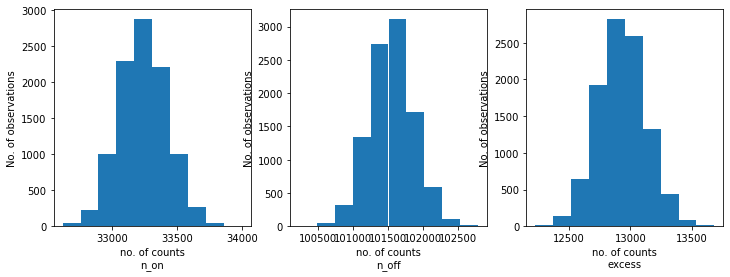

In [13]:

n_on = [dataset.counts.data.sum() for dataset in datasets]
n_off = [dataset.counts_off.data.sum() for dataset in datasets]
excess = [dataset.excess.data.sum() for dataset in datasets]

fix, axes = plt.subplots(1, 3, figsize=(12, 4))
axes[0].hist(n_on)
axes[0].set_xlabel("no. of counts\nn_on")
axes[0].set_ylabel("No. of observations")
axes[1].hist(n_off)
axes[1].set_xlabel("no. of counts\nn_off")
axes[1].set_ylabel("No. of observations")
axes[2].hist(excess)
axes[2].set_xlabel("no. of counts\nexcess");
axes[2].set_ylabel("No. of observations")

In [14]:

%%time
results = []
for dataset in datasets:
    dataset.models = model.copy()
    fit = Fit([dataset])
    result = fit.optimize()
    results.append(
        {
            "index": result.parameters["index"].value,
            "amplitude": result.parameters["amplitude"].value,
            "lambda_": result.parameters["lambda_"].value,
        }
    )

CPU times: user 23min 11s, sys: 3.67 s, total: 23min 14s
Wall time: 23min 15s


In [15]:
results

[{'index': 2.232538916476606,
  'amplitude': 1.2373518606812286e-12,
  'lambda_': 0.44514007771400643},
 {'index': 2.1921386356870185,
  'amplitude': 1.3405471272444897e-12,
  'lambda_': 0.5539388397471491},
 {'index': 2.2390306532290274,
  'amplitude': 1.2114311723919235e-12,
  'lambda_': 0.481853635003571},
 {'index': 2.2381540033754255,
  'amplitude': 1.2512809290515709e-12,
  'lambda_': 0.5030039142543251},
 {'index': 2.241836083562033,
  'amplitude': 1.2686520335181529e-12,
  'lambda_': 0.5059561427729724},
 {'index': 2.1818599630503877,
  'amplitude': 1.3849873943605872e-12,
  'lambda_': 0.5523709213406991},
 {'index': 2.2361683329909523,
  'amplitude': 1.2748053201934255e-12,
  'lambda_': 0.4974112233182603},
 {'index': 2.2015748888965336,
  'amplitude': 1.3344334689422759e-12,
  'lambda_': 0.5278376715864108},
 {'index': 2.2232129757923187,
  'amplitude': 1.2387241715088374e-12,
  'lambda_': 0.45697540823556376},
 {'index': 2.257772560517059,
  'amplitude': 1.153001391526499e-1

index: 2.219345428232621 += 0.02294343530527898


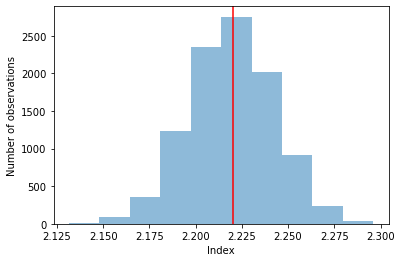

In [16]:
index = np.array([_["index"] for _ in results])
plt.hist(index, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["index"].value, color="red")
plt.xlabel("Index")
plt.ylabel("Number of observations")
print(f"index: {index.mean()} += {index.std()}")

amplitude: 1.292457566632023e-12 += 6.419452893340037e-14


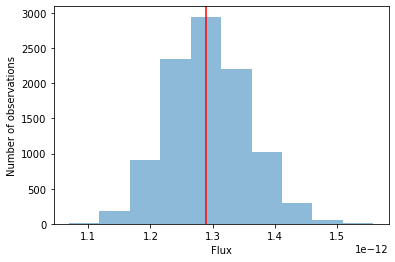

In [17]:
amplitude = np.array([_["amplitude"] for _ in results])
plt.hist(amplitude, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["amplitude"].value, color="red")
plt.xlabel("Flux")
plt.ylabel("Number of observations")
print(f"amplitude: {amplitude.mean()} += {amplitude.std()}")

lambda_: 0.5014744170635145 += 0.03771185165091271


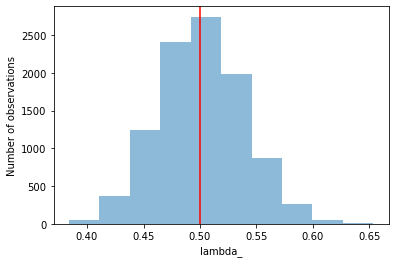

In [18]:
lambda_ = np.array([_["lambda_"] for _ in results])
plt.hist(lambda_, bins=10, alpha=0.5)
plt.axvline(x=model_simu.parameters["lambda_"].value, color="red")
plt.xlabel("lambda_")
plt.ylabel("Number of observations")
print(f"lambda_: {lambda_.mean()} += {lambda_.std()}")